# 1.Loading the data

In [0]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from tqdm import tqdm


from sklearn.metrics import f1_score
from sklearn.model_selection import GridSearchCV

import seaborn as sns
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from wordcloud import WordCloud, STOPWORDS 

In [0]:
!pip install -U -q PyDrive

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# 1. Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)



In [0]:
con = sqlite3.connect('final.sqlite')
final = pd.read_sql_query(""" SELECT * FROM Reviews""", con) 

## 3.1 Spliting CleanedText 

In [0]:
final=final.sort_values(by=['Time'],ascending=False)
finalDataPoints=final.head(10000)
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.cross_validation import cross_val_score
from collections import Counter
from sklearn.metrics import accuracy_score
from sklearn import cross_validation

x=finalDataPoints['CleanedText']


# 4.Bag of Words (BoW)

## 4.1 Unigram

In [0]:
#BOW for unigram
bow = CountVectorizer()
x_uni = bow.fit_transform(x)

##  Elbow Method

### 4.1 Finding the optimal K For kmeans


In [0]:
nCluster=[1,2,3,4,5,6,7,8,9]
cluster_errors = []
for cluster in nCluster:
    kmeans = KMeans(n_clusters = cluster, n_jobs = -1).fit(x_uni) 
    cluster_errors.append(kmeans.inertia_) 

In [0]:
clusters_df = pd.DataFrame( { "num_clusters":nCluster, "cluster_errors": cluster_errors } )

In [0]:
clusters_df[0:5]

,cluster_errors,num_clusters
0,513655.509700,1
1,502306.797115,2
2,495301.288940,3
3,489041.763107,4
4,483678.609374,5


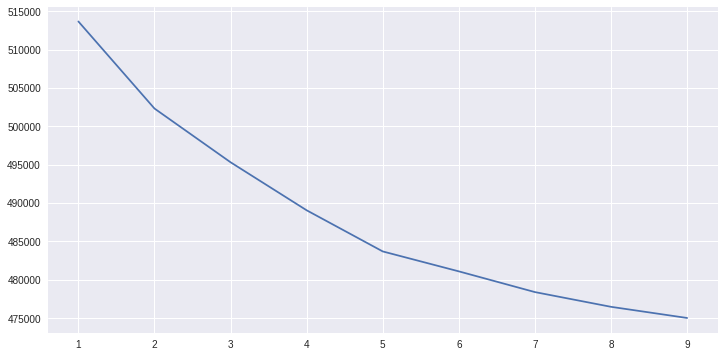

In [0]:
plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors)

### 4.2 Training the Kmeans with optimal Clusters value


In [0]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(x_uni)
labels = kmeans.labels_

### 4.3 Word Cloud

In [0]:
#finding the feature name
feature_names=bow.get_feature_names()
order_centroids = kmeans.cluster_centers_.argsort()

Cluters 0


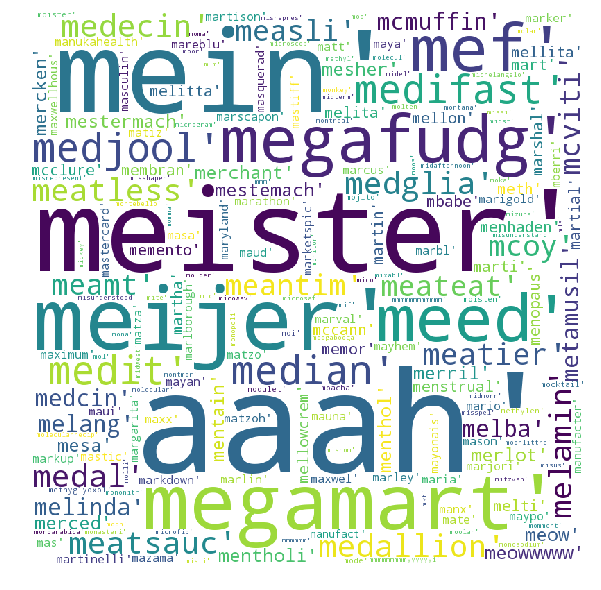

Cluters 1


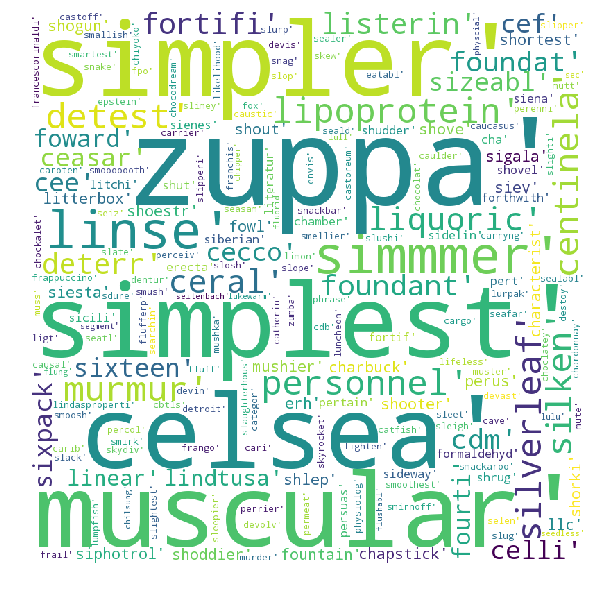

Cluters 2


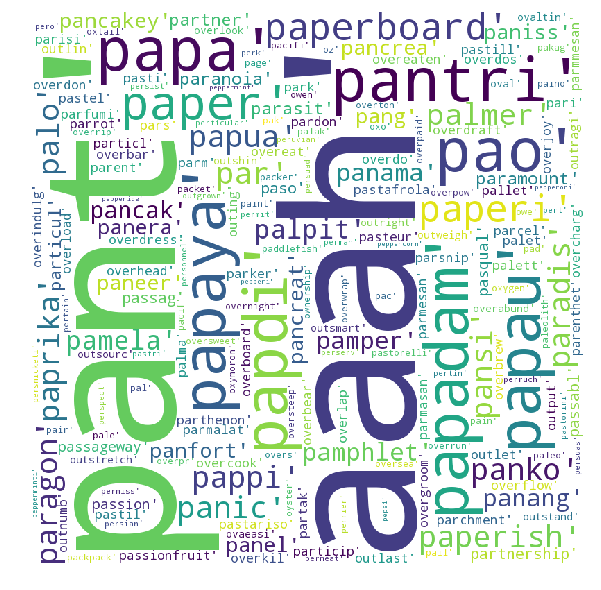

Cluters 3


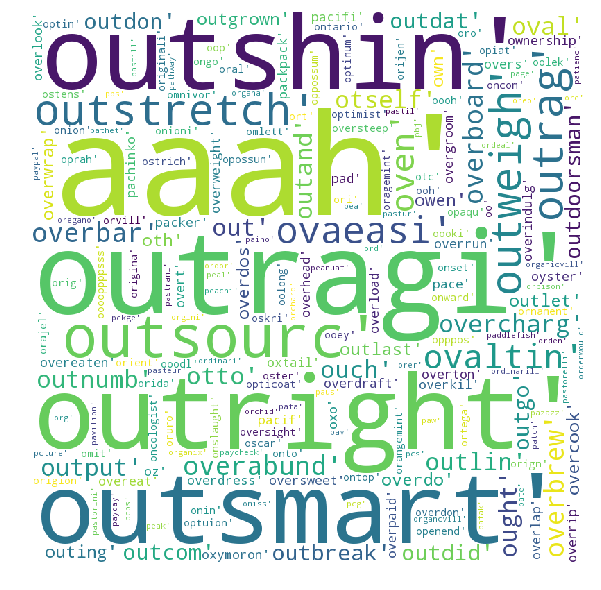

Cluters 4


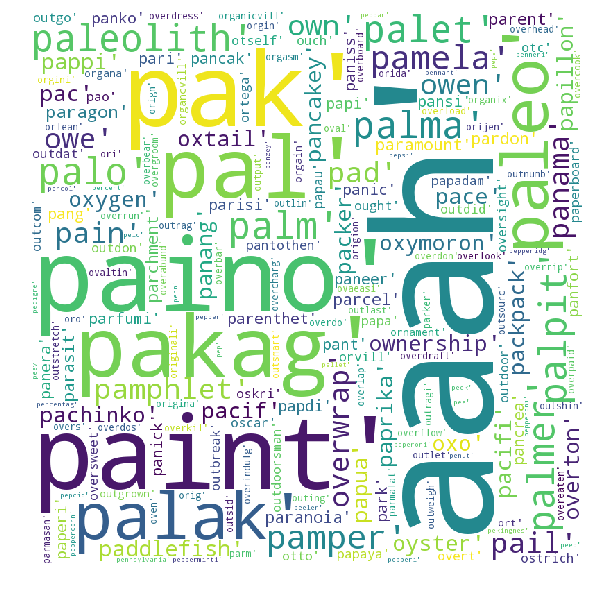

In [0]:
for i in range(5):
  clusterList=[]
  print("Cluters",i)
  for ind in order_centroids[i, :]:
    clusterList.append(feature_names[ind])
  wordcloud = WordCloud(width = 800, height = 800, 
            background_color ='white',
            min_font_size = 10).generate(str(clusterList))
  plt.figure(figsize = (8, 8), facecolor = None) 
  plt.imshow(wordcloud) 
  plt.axis("off") 
  plt.tight_layout(pad = 0) 
  plt.show()

## 4.2 Bi-gram

In [0]:
bi_gram = CountVectorizer(ngram_range=(1,2))
x_bi = bi_gram.fit_transform(x)

##  Elbow Method

### 4.2.1 Finding the optimal K For kmeans


### 4.2.2 Training the Kmeans with optimal Clusters value


In [0]:
nCluster=[1,2,3,4,5,6,7,8,9]
cluster_errors = []
for cluster in nCluster:
    kmeans = KMeans(n_clusters = cluster, n_jobs = -1).fit(x_bi) 
    cluster_errors.append(kmeans.inertia_) 

In [0]:
clusters_df = pd.DataFrame( { "num_clusters":nCluster, "cluster_errors": cluster_errors } )

In [0]:
clusters_df[0:5]

,cluster_errors,num_clusters
0,865332.920900,1
1,853751.803881,2
2,846555.725903,3
3,840453.683525,4
4,838483.303589,5


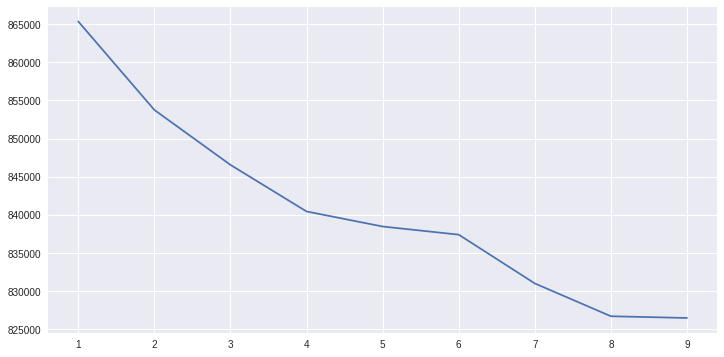

In [0]:
plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors)

In [0]:
kmeans = KMeans(n_clusters=8)
kmeans.fit(x_bi)
labels = kmeans.labels_

### 4.2.3 Word Cloud

In [0]:
#finding the feature name
feature_names=bi_gram.get_feature_names()
order_centroids = kmeans.cluster_centers_.argsort()

Cluters 0


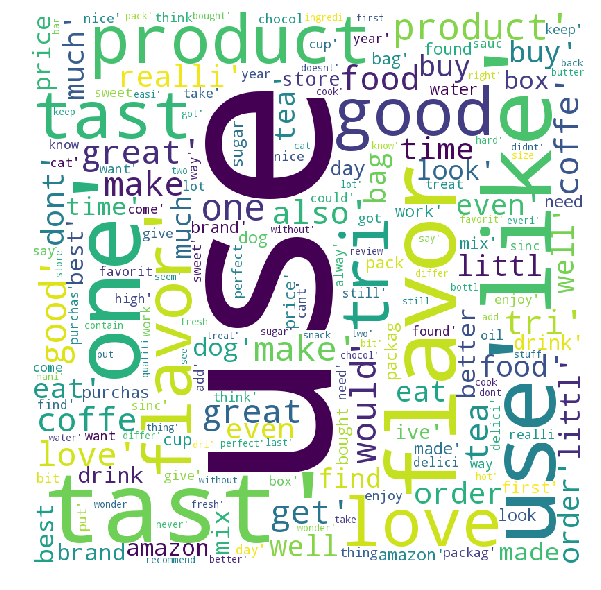

Cluters 1


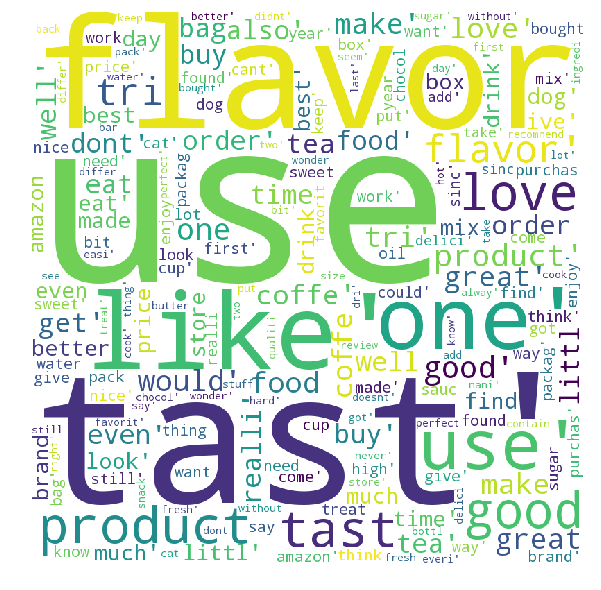

Cluters 2


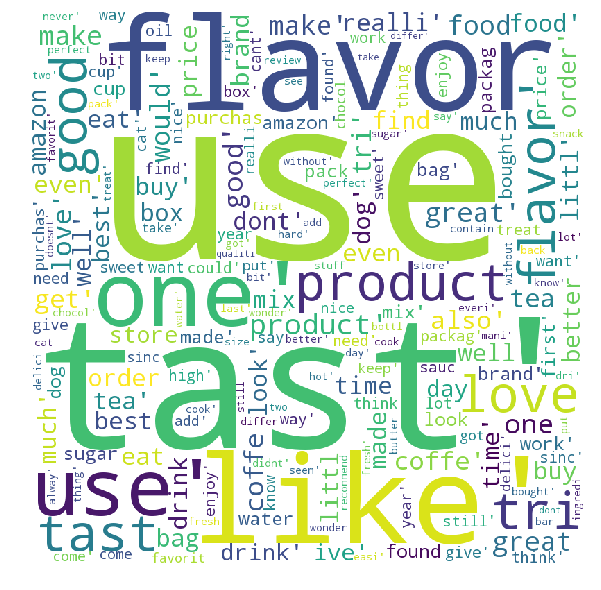

Cluters 3


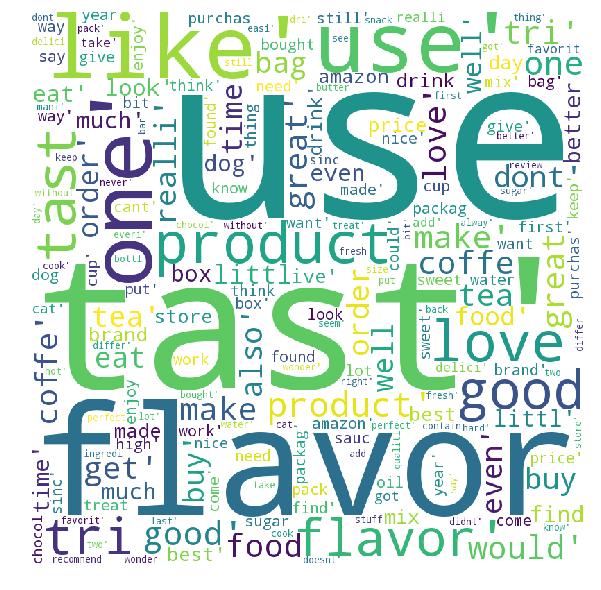

Cluters 4


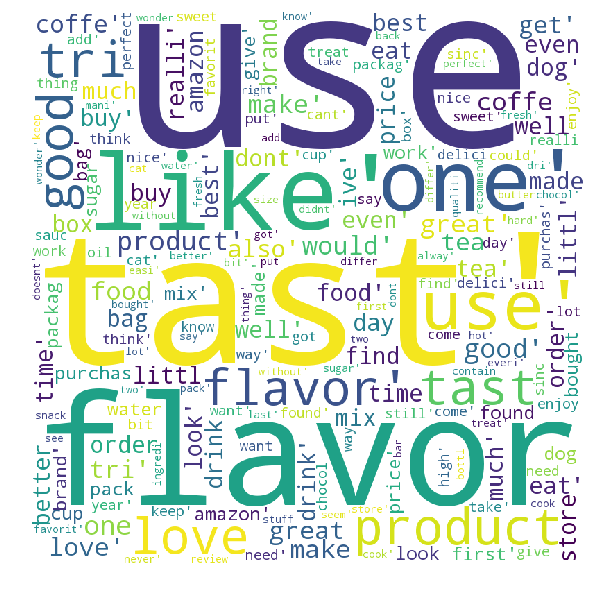

Cluters 5


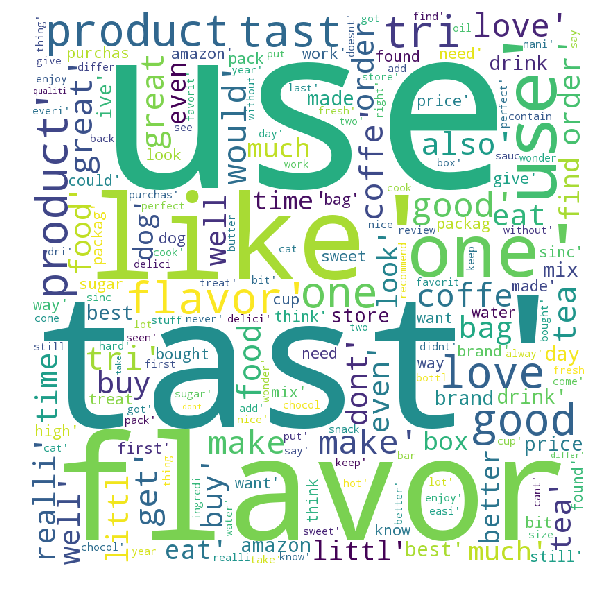

Cluters 6


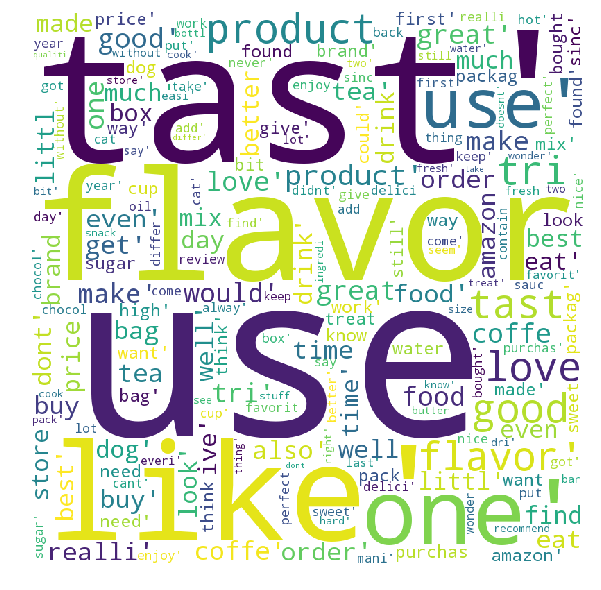

Cluters 7


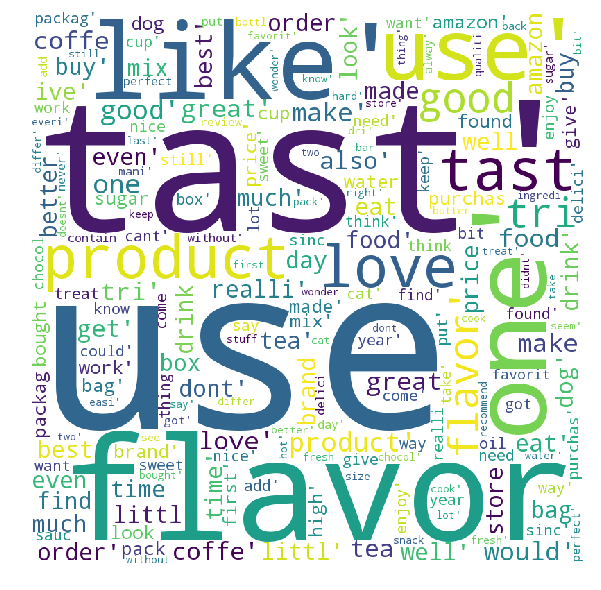

In [0]:
for i in range(8):
  clusterList_bi=[]
  print("Cluters",i)
  for ind in order_centroids[i, :]:
    clusterList_bi.append(feature_names[ind])
  wordcloud = WordCloud(width = 800, height = 800, 
            background_color ='white',
            min_font_size = 10).generate(str(clusterList_bi))
  plt.figure(figsize = (8, 8), facecolor = None) 
  plt.imshow(wordcloud) 
  plt.axis("off") 
  plt.tight_layout(pad = 0) 
  plt.show()

## 5 TF-IDF

In [0]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2))
x_tfidf = tf_idf_vect.fit_transform(x)

##  Elbow Method

### 5.1 Finding the optimal K For kmeans


In [0]:
nCluster=[1,2,3,4,5,6,7,8,9]
cluster_errors = []
for cluster in nCluster:
    kmeans = KMeans(n_clusters = cluster, n_jobs = -1).fit(x_tfidf) 
    cluster_errors.append(kmeans.inertia_) 

In [0]:
clusters_df = pd.DataFrame( { "num_clusters":nCluster, "cluster_errors": cluster_errors } )

In [0]:
clusters_df[0:5]

,cluster_errors,num_clusters
0,9924.360933,1
1,9900.351007,2
2,9877.277103,3
3,9861.166338,4
4,9853.034008,5


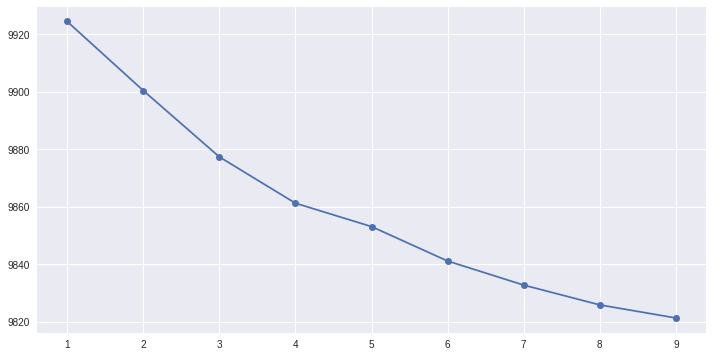

In [0]:
plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors,marker = "o")

### 5.2 Training the Kmeans with optimal Clusters value


In [0]:
kmeans = KMeans(n_clusters=6)
kmeans.fit(x_tfidf)
labels = kmeans.labels_

### 5.3 Word Cloud

In [0]:
#finding the feature name
feature_names=tf_idf_vect.get_feature_names()
order_centroids = kmeans.cluster_centers_.argsort()

Cluters 0


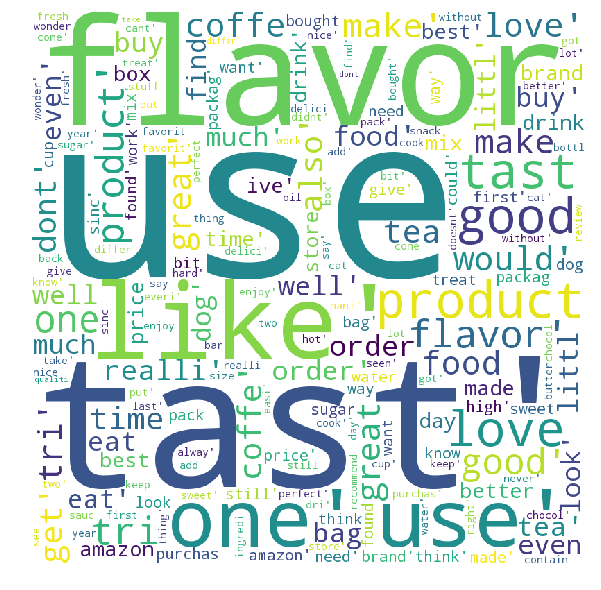

Cluters 1


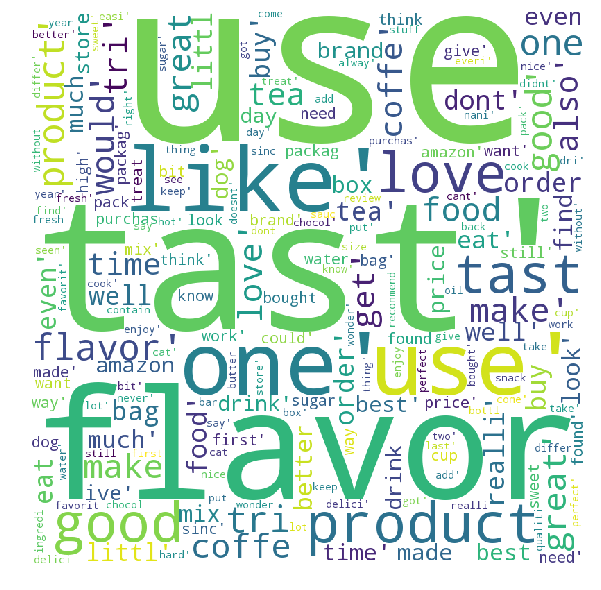

Cluters 2


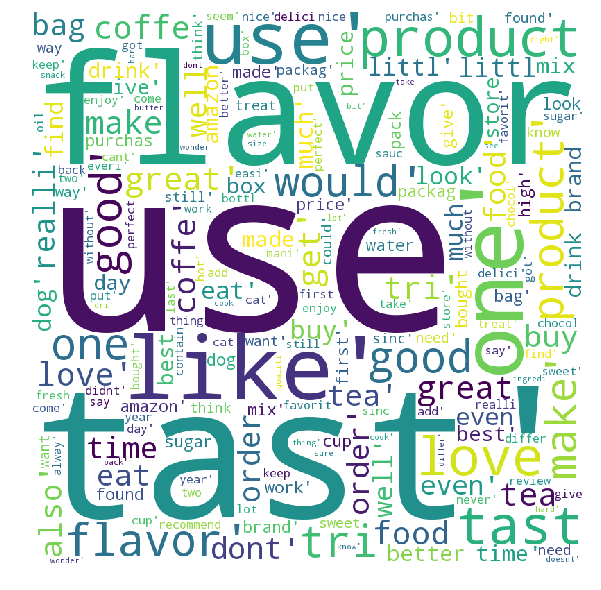

Cluters 3


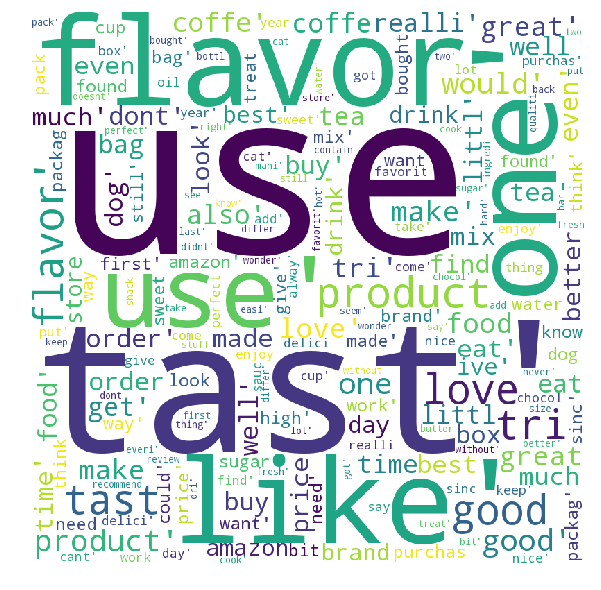

Cluters 4


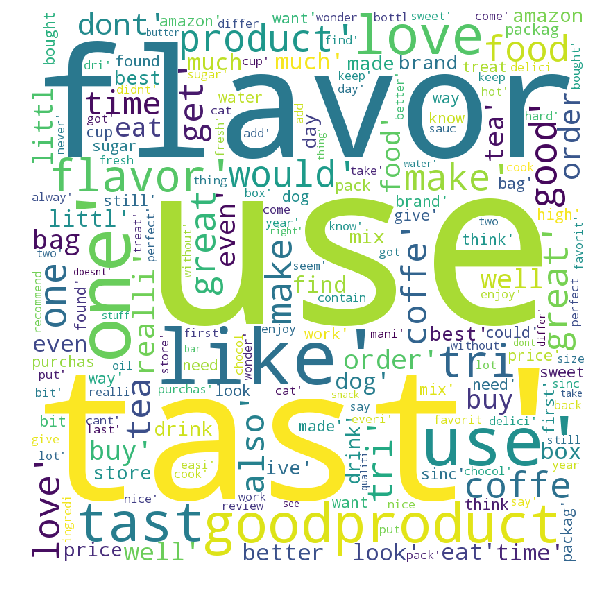

Cluters 5


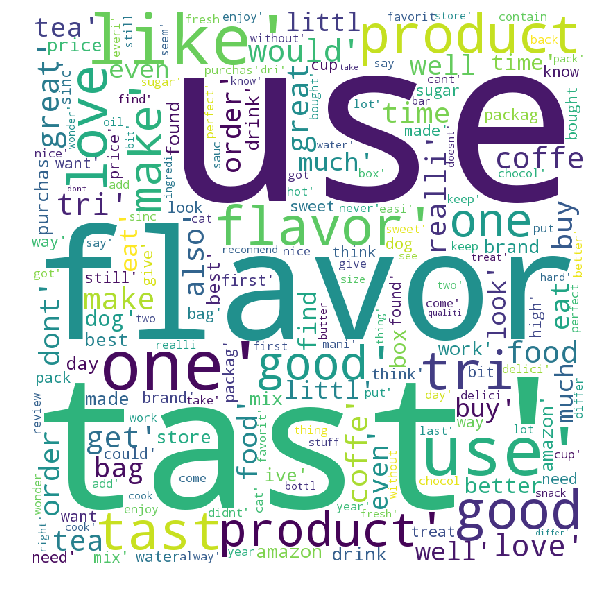

In [0]:
for i in range(6):
  clusterList_tfidf=[]
  print("Cluters",i)
  for ind in order_centroids[i, :]:
    clusterList_tfidf.append(feature_names[ind])
  wordcloud = WordCloud(width = 800, height = 800, 
            background_color ='white',
            min_font_size = 10).generate(str(clusterList_tfidf))
  plt.figure(figsize = (8, 8), facecolor = None) 
  plt.imshow(wordcloud) 
  plt.axis("off") 
  plt.tight_layout(pad = 0) 
  plt.show()

# 6 Word2Vec

In [0]:
i=0
list_of_sent=[]
for sent in x:
    list_of_sent.append(sent.split())

In [18]:
w2v_model=Word2Vec(list_of_sent,min_count=5,size=50, workers=4)

In [19]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  4205
sample words  ['big', 'lover', 'fig', 'jam', 'uniqu', 'flavor', 'kind', 'mix', 'light', 'dark', 'mission', 'must', 'tri', 'great', 'product', 'good', 'price', 'definit', 'order', 'use', 'bottl', 'empti', 'expect', 'box', 'full', 'fortun', 'cooki', 'like', 'one', 'nonetheless', 'got', 'small', 'tast', 'weird', 'okay', 'best', 'ever', 'review', 'amazon', 'check', 'label', 'contain', 'sure', 'enough', 'top', 'ingredi', 'ive', 'done', 'research', 'also']


# 7.Avg W2V

In [0]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in list_of_sent: # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

10000
50


In [0]:
x_av1=sent_vectors

##  Elbow Method

### 7.1 Finding the optimal K For kmeans


In [0]:
nCluster=[1,2,3,4,5,6,7,8,9]
cluster_errors = []
for cluster in nCluster:
    kmeans = KMeans(n_clusters = cluster, n_jobs = -1).fit(x_av1) 
    cluster_errors.append(kmeans.inertia_) 

In [0]:
clusters_df = pd.DataFrame( { "num_clusters":nCluster, "cluster_errors": cluster_errors } )

In [0]:
clusters_df[0:5]

,cluster_errors,num_clusters
0,15695.950133,1
1,12171.381565,2
2,10133.884381,3
3,8881.236930,4
4,8207.534361,5


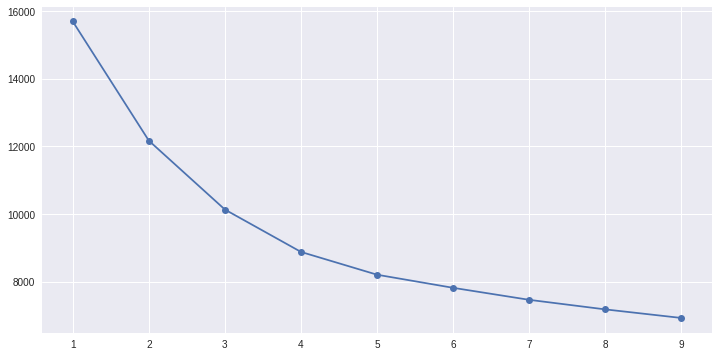

In [0]:
plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors,marker = "o")

### 7.2 Training the Kmeans with optimal Clusters value


In [0]:
kmeans = KMeans(n_clusters=6)
kmeans.fit(x_av1)
labels = kmeans.labels_

### 4.3 Word Cloud

In [0]:
feature_names=w2v_model.wv.index2word
order_centroids = kmeans.cluster_centers_.argsort()

Cluters 0


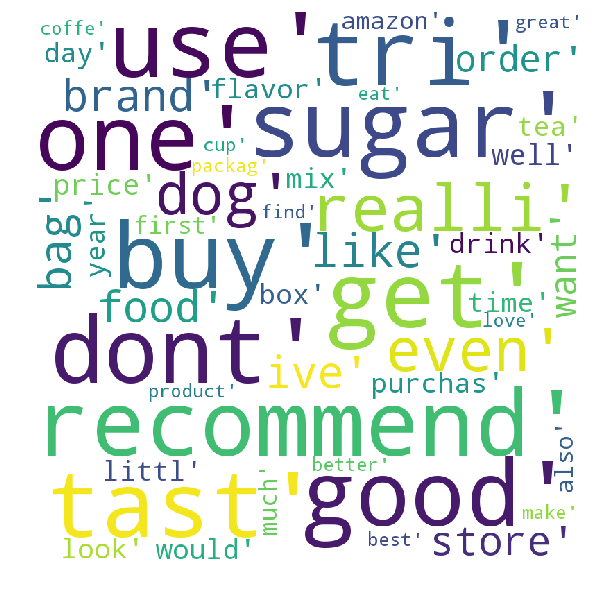

Cluters 1


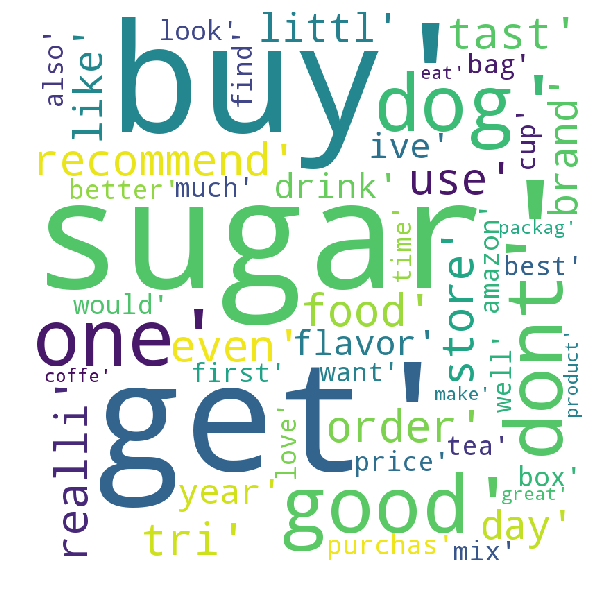

Cluters 2


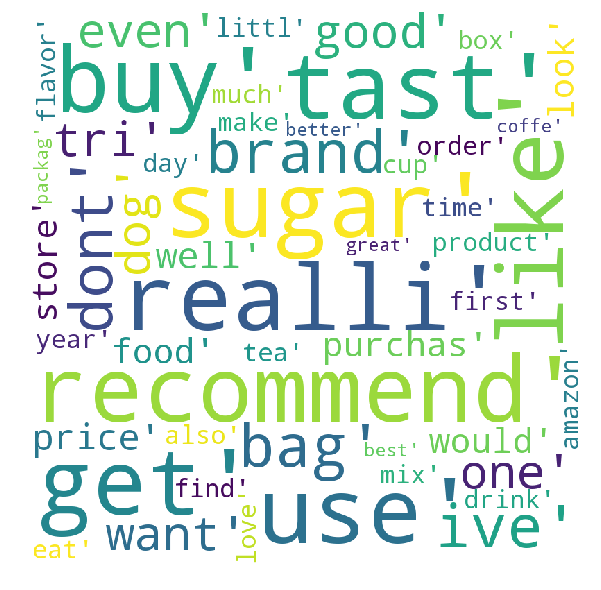

Cluters 3


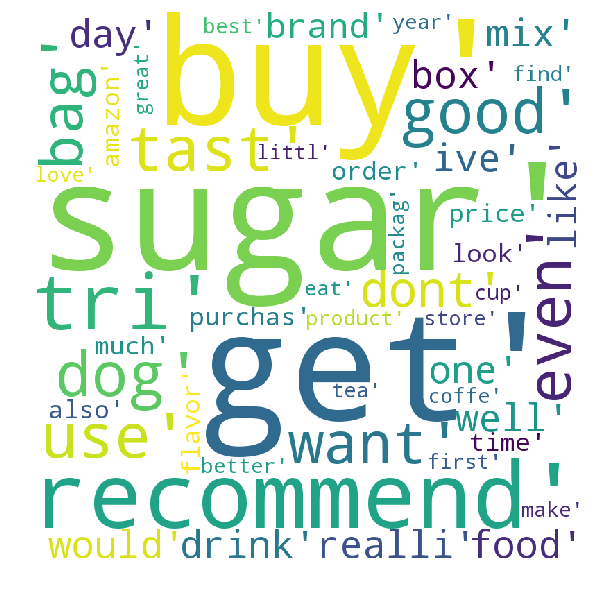

Cluters 4


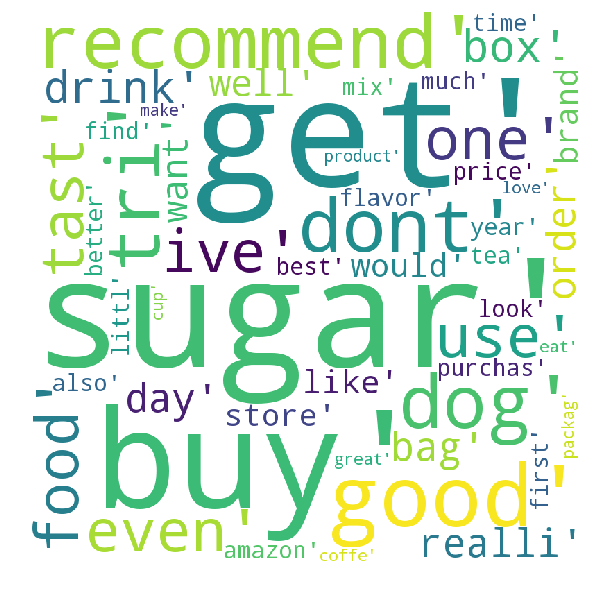

Cluters 5


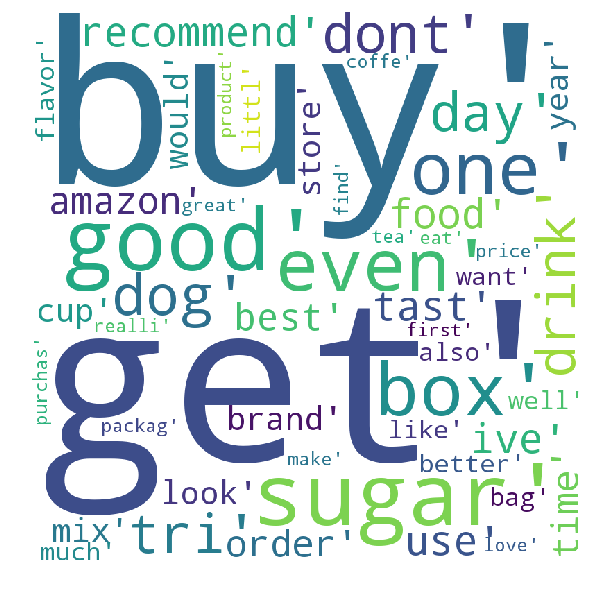

In [0]:
for i in range(6):
  clusterList_x_av1=[]
  print("Cluters",i)
  for ind in order_centroids[i, :]:
    clusterList_x_av1.append(feature_names[ind])
  wordcloud = WordCloud(width = 800, height = 800, 
            background_color ='white',
            min_font_size = 10).generate(str(clusterList_x_av1))
  plt.figure(figsize = (8, 8), facecolor = None) 
  plt.imshow(wordcloud) 
  plt.axis("off") 
  plt.tight_layout(pad = 0) 
  plt.show()

# 8. TFIDF-W2V

In [0]:
tf_idf_vect = TfidfVectorizer()
final_tf_idf = tf_idf_vect.fit_transform(x)
dictionary = dict(zip(tf_idf_vect.get_feature_names(), list(tf_idf_vect.idf_)))

In [0]:
# TF-IDF weighted Word2Vec
tfidf_feat = tf_idf_vect.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sent): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            tf_idf = dictionary[word]*sent.count(word)
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1

100%|██████████| 10000/10000 [00:11<00:00, 878.90it/s]


In [0]:
x_tdfw2v=tfidf_sent_vectors

In [0]:
nCluster=[1,2,3,4,5,6,7,8,9]
cluster_errors = []
for cluster in nCluster:
    kmeans = KMeans(n_clusters = cluster, n_jobs = -1).fit(x_tdfw2v) 
    cluster_errors.append(kmeans.inertia_) 

In [0]:
clusters_df = pd.DataFrame( { "num_clusters":nCluster, "cluster_errors": cluster_errors } )

In [0]:
clusters_df[0:5]

,cluster_errors,num_clusters
0,21055.889626,1
1,16025.581427,2
2,13007.900679,3
3,11033.444145,4
4,10109.221344,5


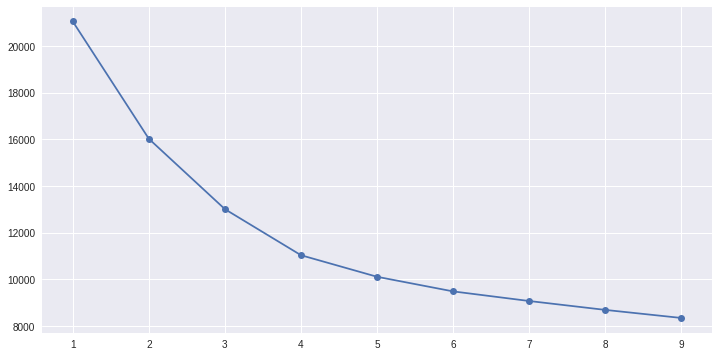

In [0]:
plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors,marker = "o")

### 4.2 Training the Kmeans with optimal Clusters value


In [0]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(x_tdfw2v)
labels = kmeans.labels_

### 4.3 Word Cloud

In [0]:
#finding the feature name
feature_names=w2v_model.wv.index2word
order_centroids = kmeans.cluster_centers_.argsort()

Cluters 0


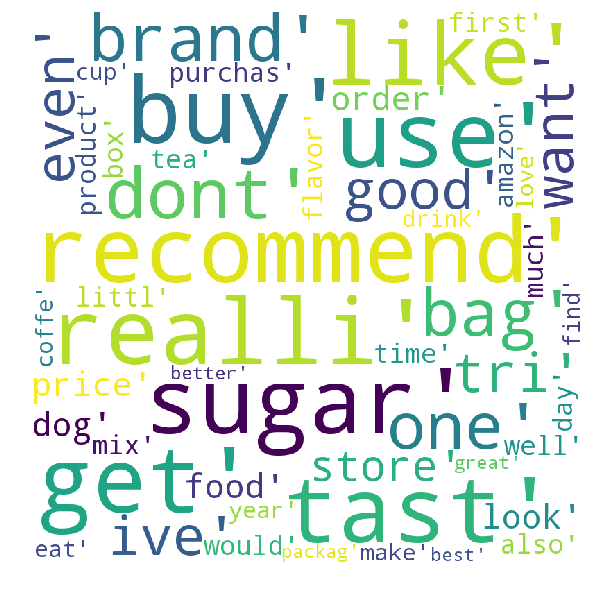

Cluters 1


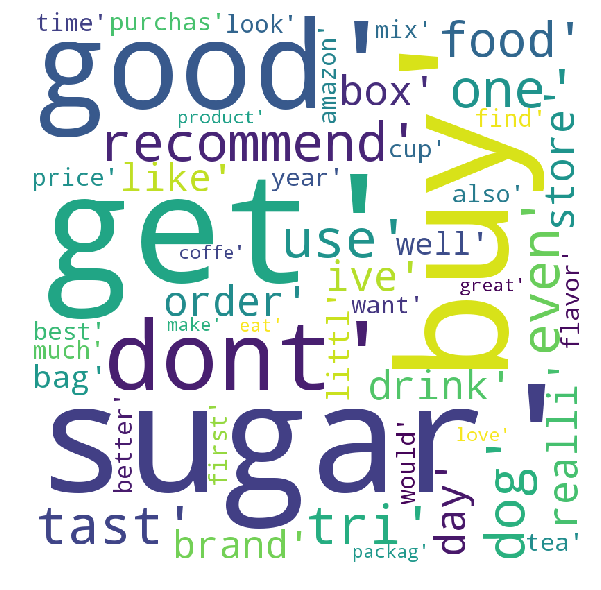

Cluters 2


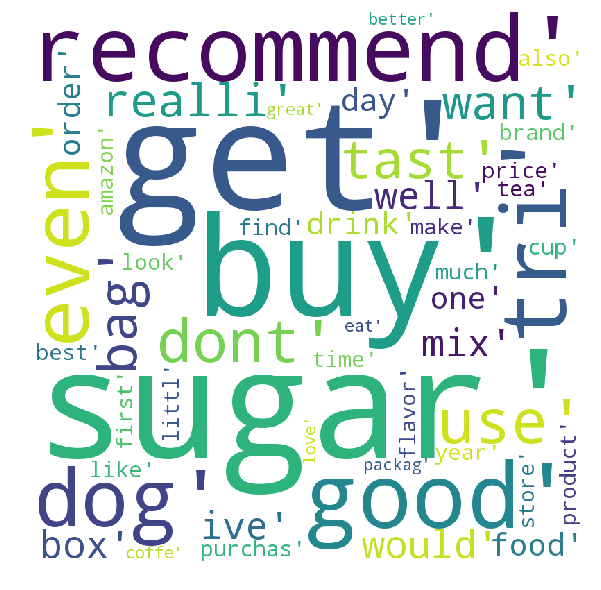

Cluters 3


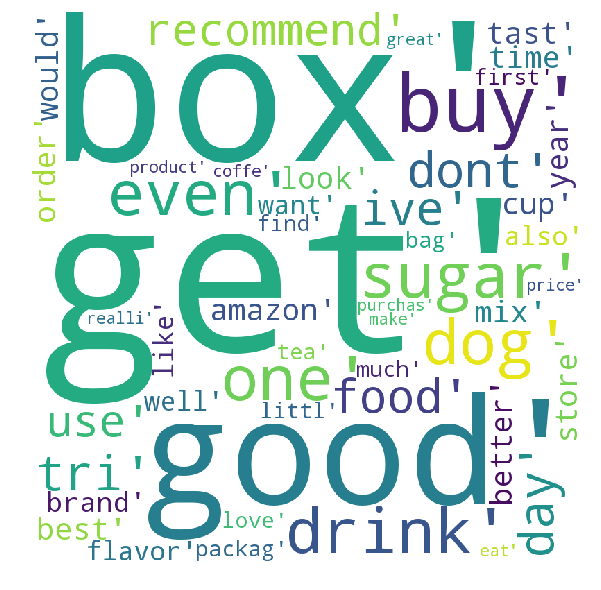

In [0]:
for i in range(4):
  clusterList_tdfw2v=[]
  print("Cluters",i)
  for ind in order_centroids[i, :]:
    clusterList_tdfw2v.append(feature_names[ind])
  wordcloud = WordCloud(width = 800, height = 800, 
            background_color ='white',
            min_font_size = 10).generate(str(clusterList_tdfw2v))
  plt.figure(figsize = (8, 8), facecolor = None) 
  plt.imshow(wordcloud) 
  plt.axis("off") 
  plt.tight_layout(pad = 0) 
  plt.show()

## Medoids

In [0]:
# code borrowed from https://raw.githubusercontent.com/letiantian/kmedoids/master/kmedoids.py
# this function finds clusters using k-medoids method 
# returns C : dictionary of all the reviews belonging to particular cluster label
# returns M : contains the index of central review of cluster
import numpy as np
import random

def kMedoid(D, k, tmax=100):
    # determine dimensions of distance matrix D
    m, n = D.shape

    if k > n:
        raise Exception('too many medoids')

    # find a set of valid initial cluster medoid indices since we
    # can't seed different clusters with two points at the same location
    valid_medoid_inds = set(range(n))
    invalid_medoid_inds = set([])
    rs,cs = np.where(D==0)
    # the rows, cols must be shuffled because we will keep the first duplicate below
    index_shuf = list(range(len(rs)))
    np.random.shuffle(index_shuf)
    rs = rs[index_shuf]
    cs = cs[index_shuf]
    for r,c in zip(rs,cs):
        # if there are two points with a distance of 0...
        # keep the first one for cluster init
        if r < c and r not in invalid_medoid_inds:
            invalid_medoid_inds.add(c)
    valid_medoid_inds = list(valid_medoid_inds - invalid_medoid_inds)

    if k > len(valid_medoid_inds):
        raise Exception('too many medoids (after removing {} duplicate points)'.format(
            len(invalid_medoid_inds)))

    # randomly initialize an array of k medoid indices
    M = np.array(valid_medoid_inds)
    np.random.shuffle(M)
    M = np.sort(M[:k])

    # create a copy of the array of medoid indices
    Mnew = np.copy(M)

    # initialize a dictionary to represent clusters
    C = {}
    for t in range(tmax):
        # determine clusters, i. e. arrays of data indices
        J = np.argmin(D[:,M], axis=1)
        for kappa in range(k):
            C[kappa] = np.where(J==kappa)[0]
        # update cluster medoids
        for kappa in range(k):
            J = np.mean(D[np.ix_(C[kappa],C[kappa])],axis=1)
            j = np.argmin(J)
            Mnew[kappa] = C[kappa][j]
        np.sort(Mnew)
        # check for convergence
        if np.array_equal(M, Mnew):
            break
        M = np.copy(Mnew)
    else:
        # final update of cluster memberships
        J = np.argmin(D[:,M], axis=1)
        for kappa in range(k):
            C[kappa] = np.where(J==kappa)[0]

    # return results
    return M, C

In [0]:
def compute_loss(M, C, data): # Squared Loss. !!
    loss = 0.0
    for key, arr in C.items():
        for pos in arr:
            loss = loss + ((data[M[key]] - data[pos]).sum()) ** 2
    
    return loss

# 4.Bag of Words (BoW)

## 4.1 Unigram

In [0]:
from sklearn.metrics import pairwise_distances
#BOW for unigram
bow = CountVectorizer()
x_uni = bow.fit_transform(x)
D = pairwise_distances(x_uni, metric='euclidean')

In [0]:
#finding the feature name
feature_names=bow.get_feature_names()


In [0]:
# Choosing the best cluster using Elbow Method.
squared_errors = []
num_clus=[1,2,3,4,5,6,7,8,9]
for cluster in num_clus:
    M, C = kMedoid(D, cluster) # Training Clustering.
    squared_errors.append(compute_loss(M, C, x_uni)) # Appending the squared loss obtained in the list

In [0]:
clusters_df = pd.DataFrame( { "num_clusters":num_clus, "cluster_errors": squared_errors } )

Optimal number of cluster =  7


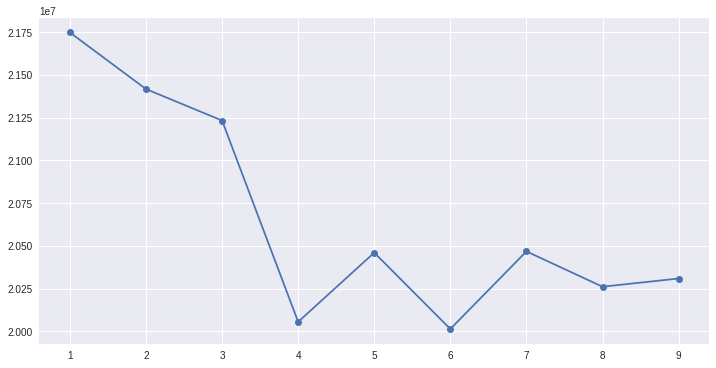

In [0]:
plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors,marker = "o")
optimal_cluster = np.argmin(clusters_df.cluster_errors)+2
print('Optimal number of cluster = ',optimal_cluster)

In [0]:
M, C = kMedoid(D,optimal_cluster)

In [0]:
cluster0 = []
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []


for label in C:
    for point_idx in C[label]:
        if label == 0 :
            cluster0.append(feature_names[point_idx])
        elif label == 1:
            cluster1.append(feature_names[point_idx])
        elif label == 2:
            cluster2.append(feature_names[point_idx])
        elif label == 3:
            cluster3.append(feature_names[point_idx])
        elif label == 4:
            cluster4.append(feature_names[point_idx])
        elif label == 5:
            cluster5.append(feature_names[point_idx])
        elif label == 6:
            cluster6.append(feature_names[point_idx]) 
            

In [0]:
word_cloud=[cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,cluster6]

Cluters 0


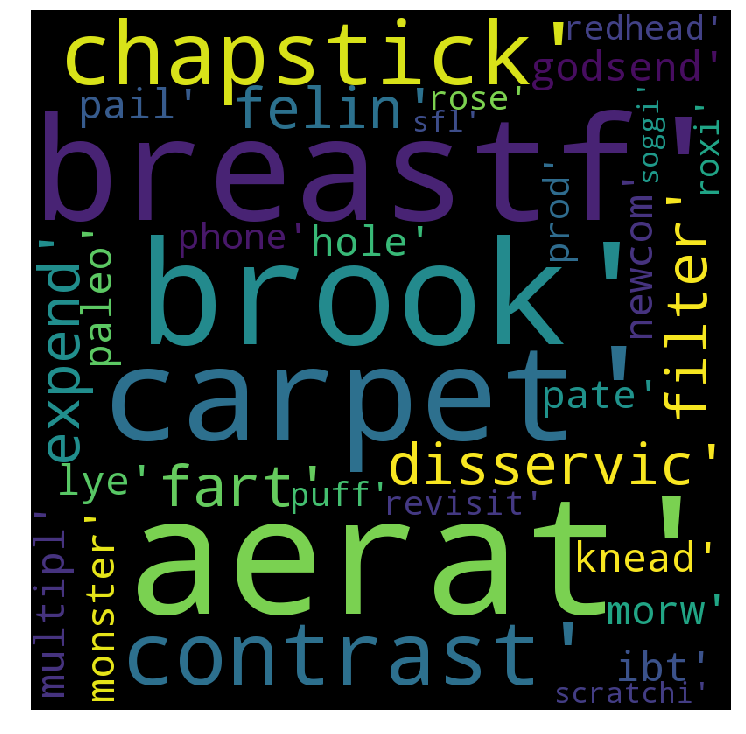

Cluters 1


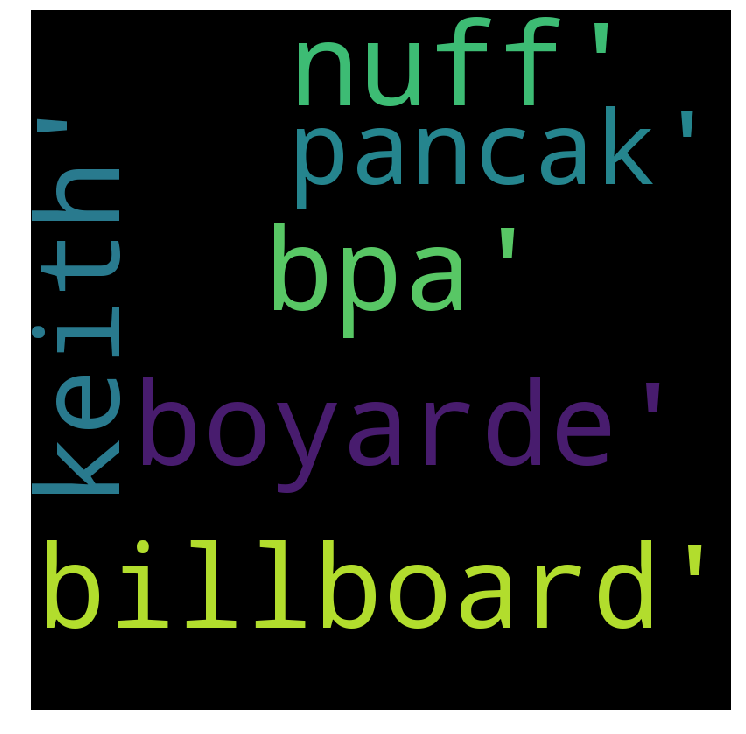

Cluters 2


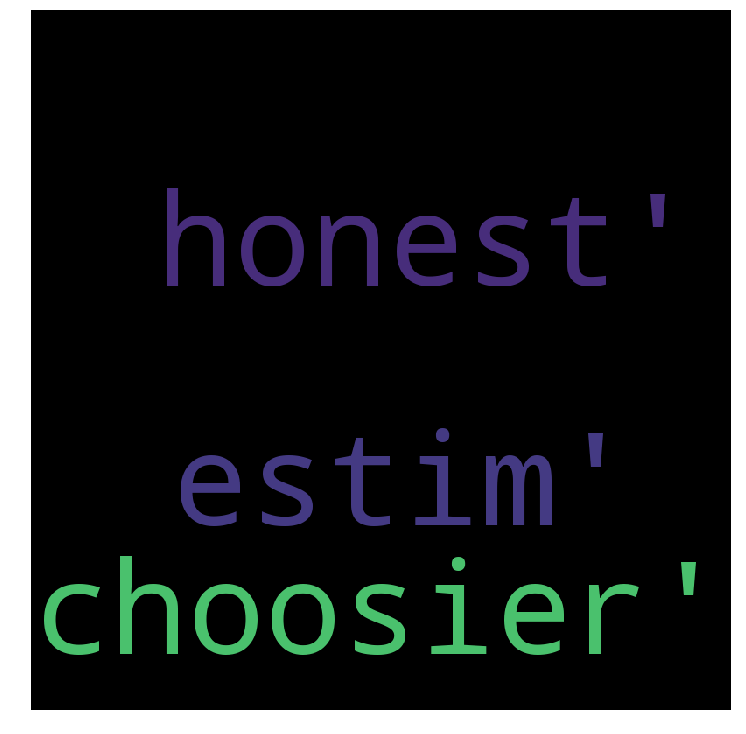

Cluters 3


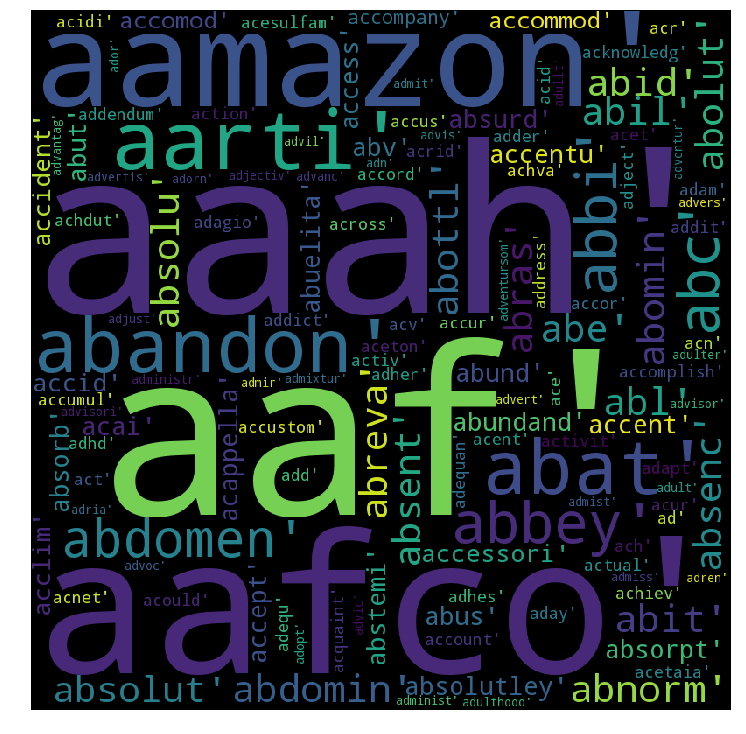

Cluters 4


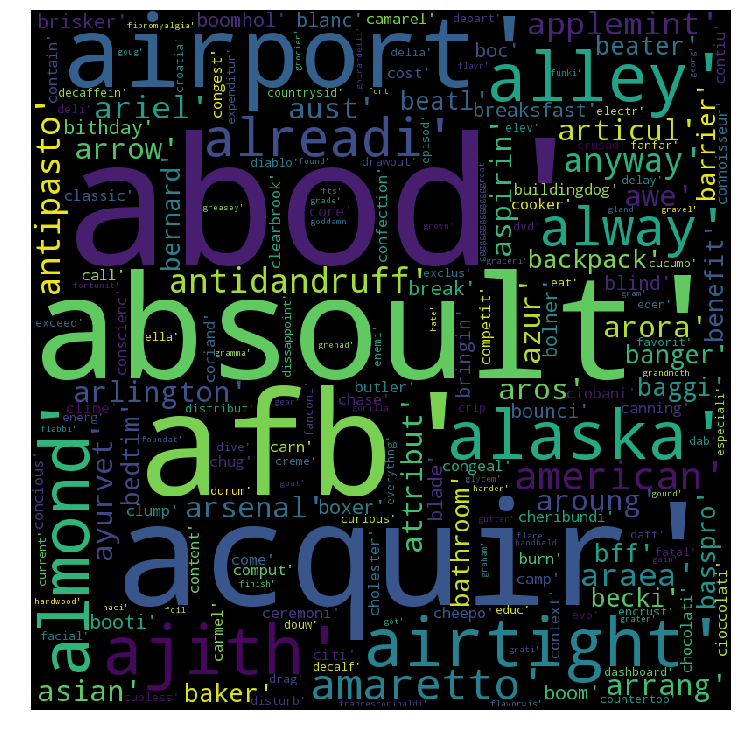

Cluters 5


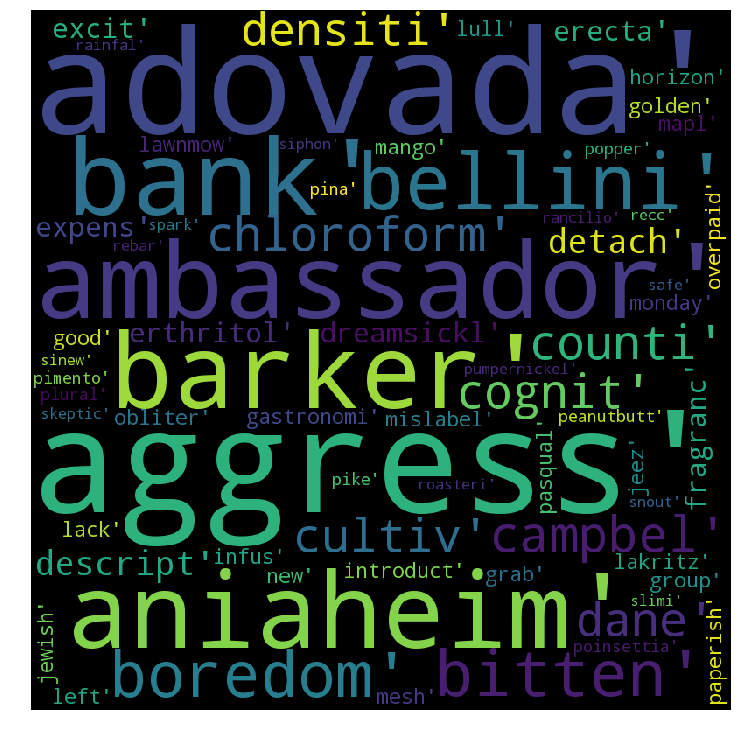

Cluters 6


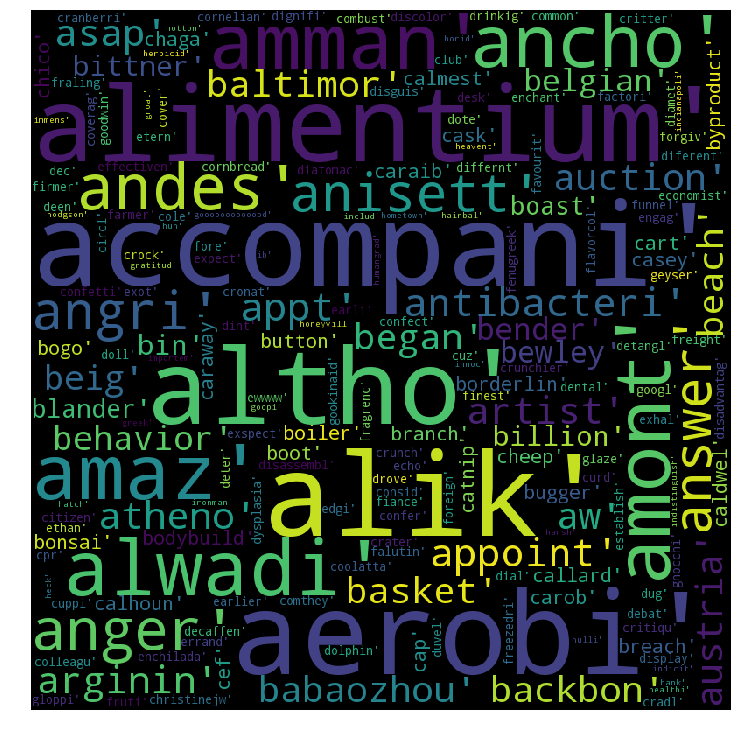

In [0]:
i=0
for Cluster in word_cloud:
  print("Cluters",i)
  wordcloud = WordCloud(width = 800, height = 800, 
            background_color ='black',
            min_font_size = 10).generate(str(Cluster))
  plt.figure(figsize = (10,10), facecolor = None) 
  plt.imshow(wordcloud) 
  plt.axis("off") 
  plt.tight_layout(pad = 0) 
  plt.show()
  i=i+1

## 4.2 Bi-gram

In [0]:
bi_gram = CountVectorizer(ngram_range=(1,2))
x_bi = bi_gram.fit_transform(x)

In [0]:
D_bi = pairwise_distances(x_bi, metric='euclidean')

In [0]:
#finding the feature name
feature_names=bi_gram.get_feature_names()

In [0]:
# Choosing the best cluster using Elbow Method.
squared_errors = []
num_clus=[1,2,3,4,5,6,7,8,9]
for cluster in num_clus:
    M, C = kMedoid(D_bi, cluster) # Training Clustering.
    squared_errors.append(compute_loss(M, C, x_bi)) # Appending the squared loss obtained in the list

In [0]:
clusters_df = pd.DataFrame( { "num_clusters":num_clus, "cluster_errors": squared_errors } )

Optimal number of cluster =  10


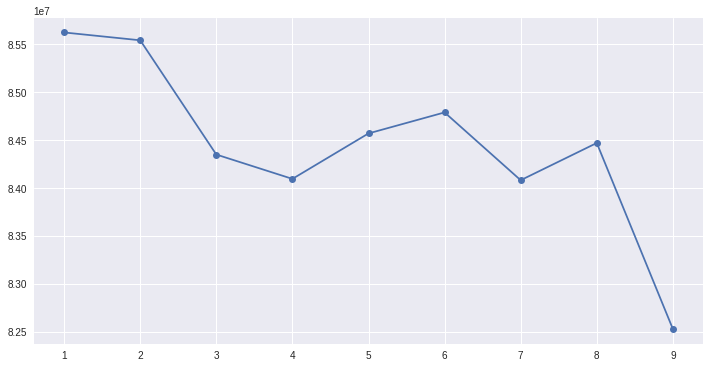

In [0]:
plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors,marker = "o")
optimal_cluster = np.argmin(clusters_df.cluster_errors)+2
print('Optimal number of cluster = ',optimal_cluster)

In [0]:
M, C = kMedoid(D_bi,optimal_cluster)

In [0]:
cluster0 = []
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []
cluster8 = []
cluster9 = []


for label in C:
    for point_idx in C[label]:
        if label == 0 :
            cluster0.append(feature_names[point_idx])
        elif label == 1:
            cluster1.append(feature_names[point_idx])
        elif label == 2:
            cluster2.append(feature_names[point_idx])
        elif label == 3:
            cluster3.append(feature_names[point_idx])
        elif label == 4:
            cluster4.append(feature_names[point_idx])
        elif label == 5:
            cluster5.append(feature_names[point_idx])
        elif label == 6:
            cluster6.append(feature_names[point_idx])
        elif label == 7:
            cluster7.append(feature_names[point_idx])
        elif label == 8:
            cluster8.append(feature_names[point_idx])
        elif label == 9:
            cluster9.append(feature_names[point_idx])
            

In [0]:
word_cloud=[cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7,cluster8,cluster9]

Cluters 0


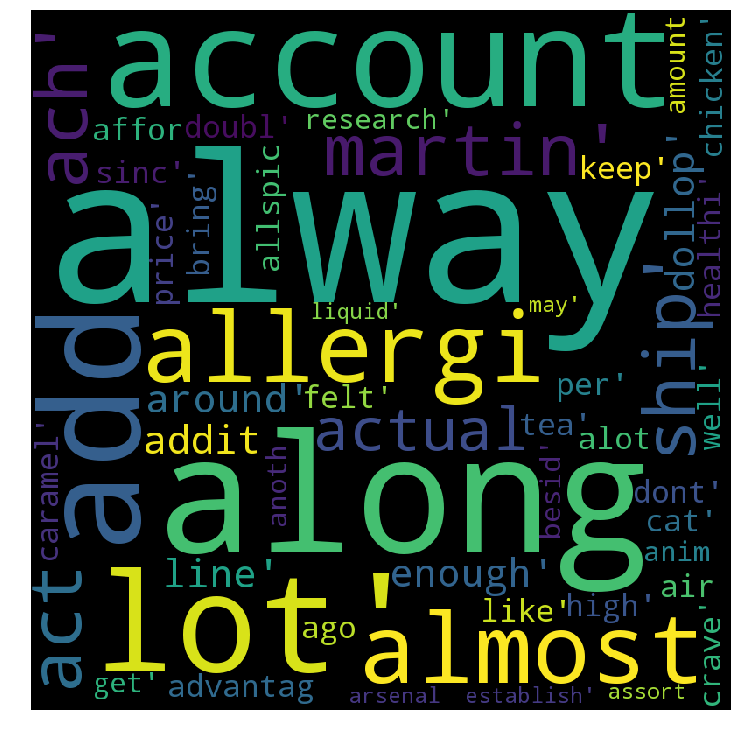

Cluters 1


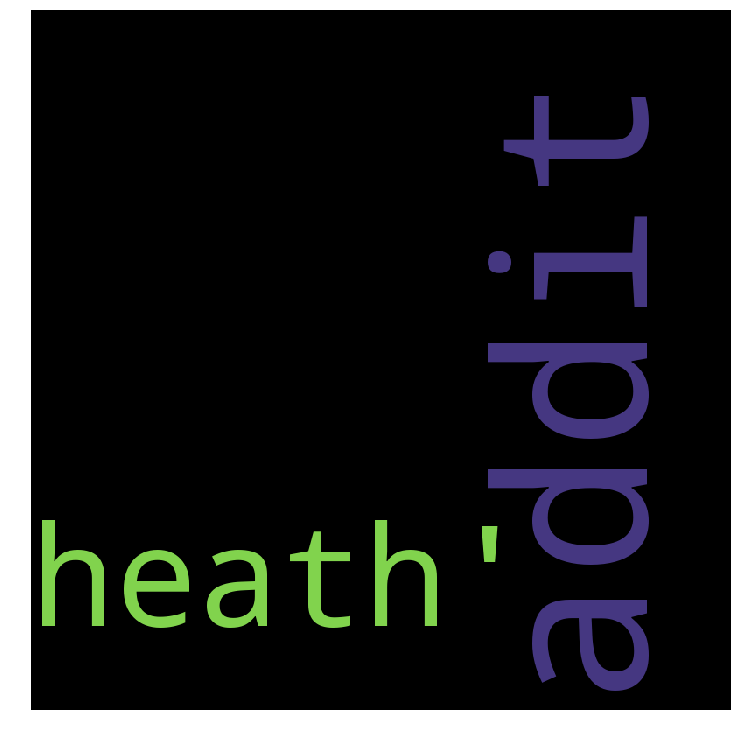

Cluters 2


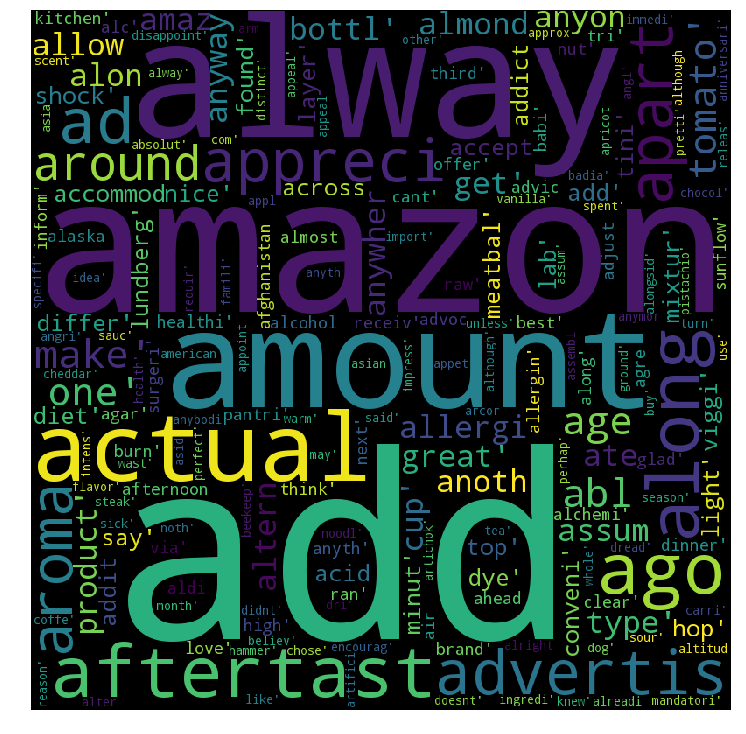

Cluters 3


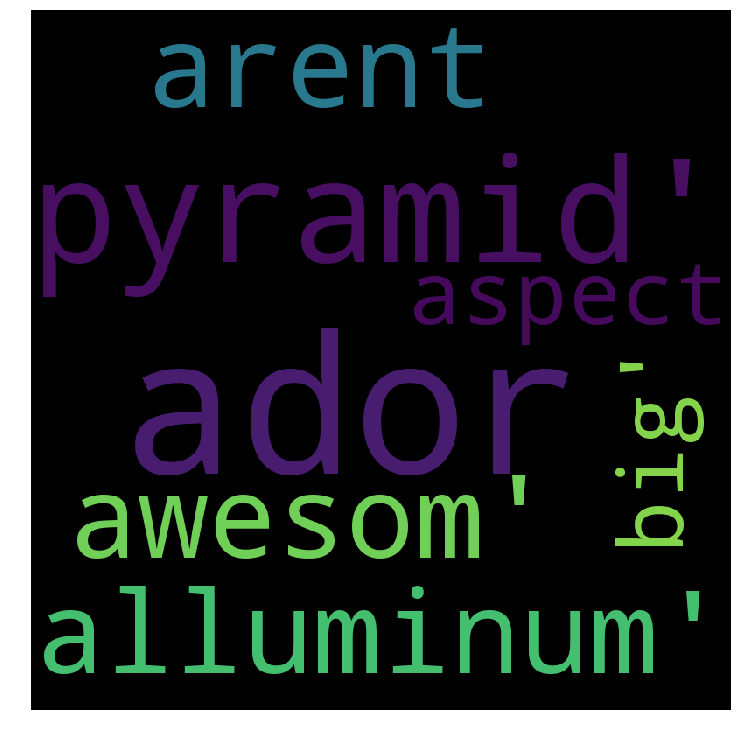

Cluters 4


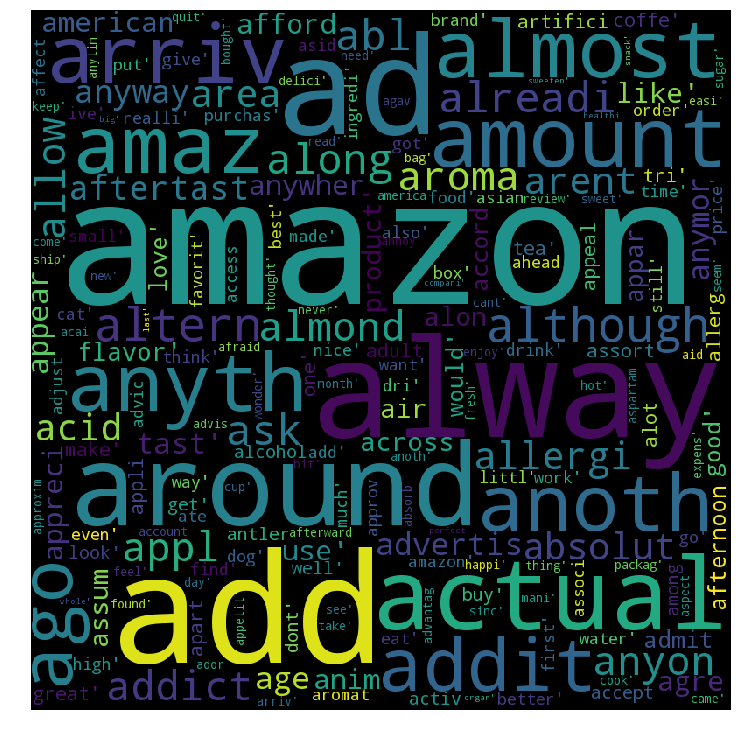

Cluters 5


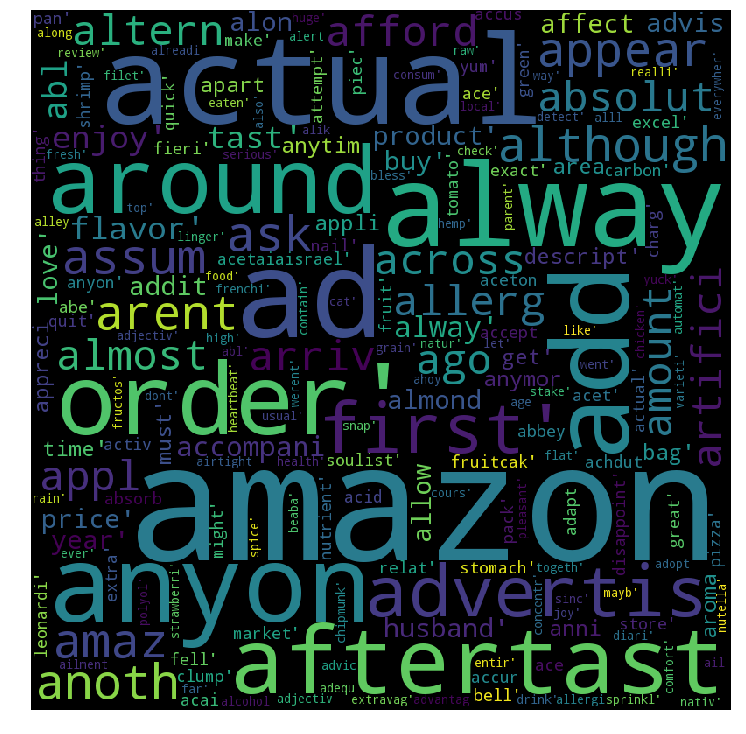

Cluters 6


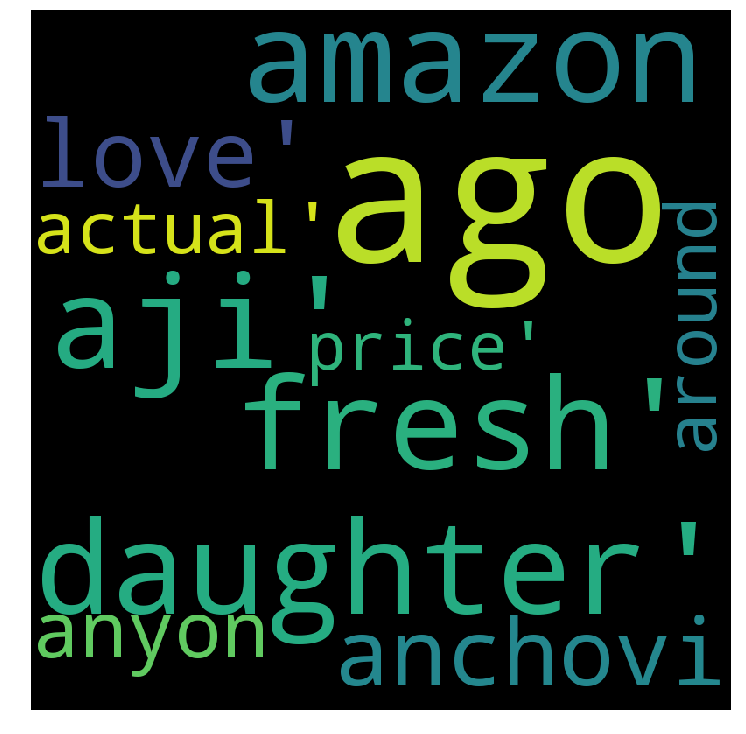

Cluters 7


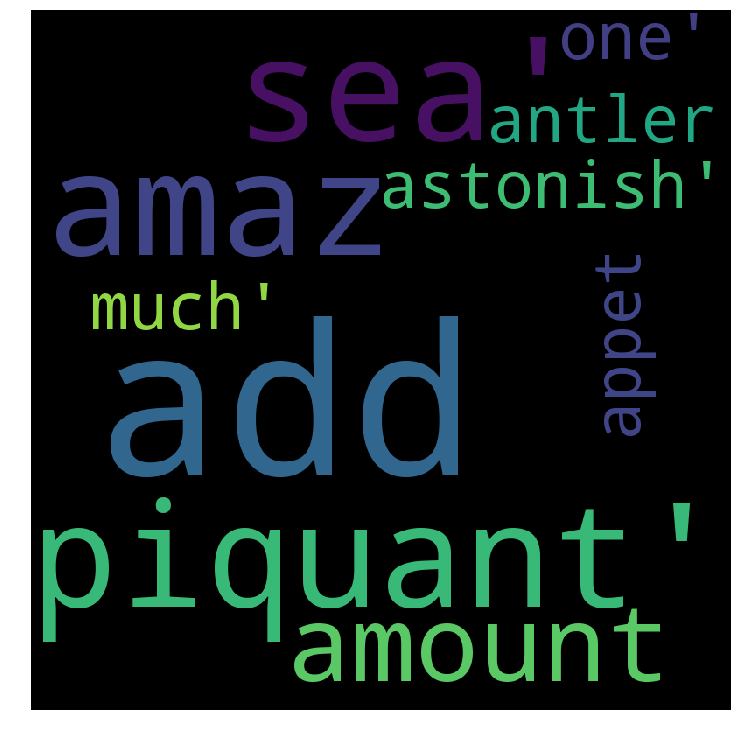

Cluters 8


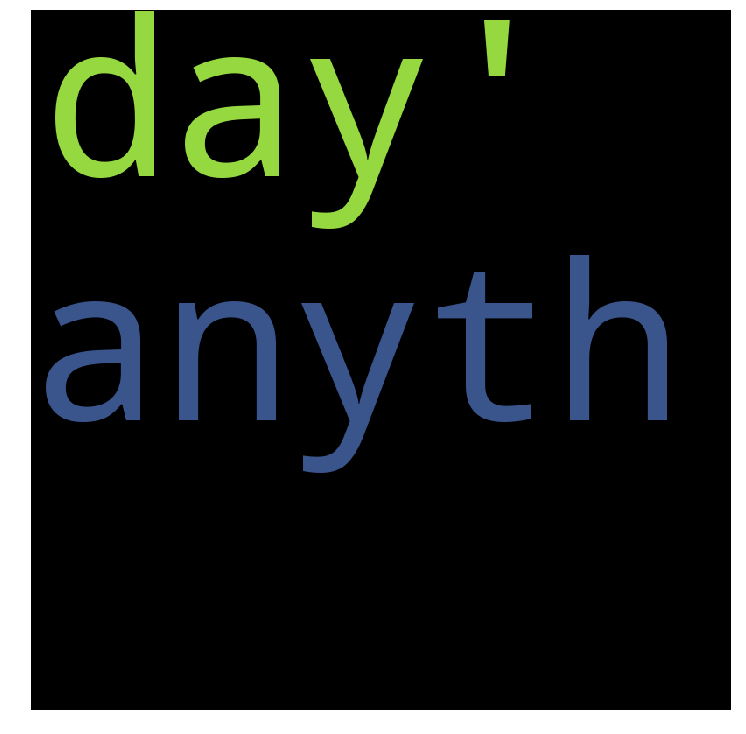

Cluters 9


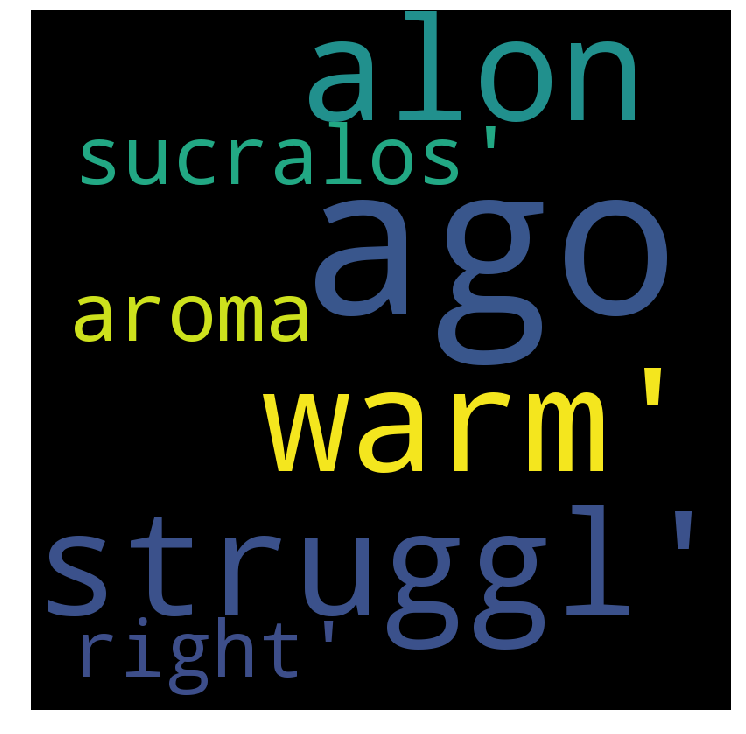

In [0]:
i=0
for Cluster in word_cloud:
  print("Cluters",i)
  wordcloud = WordCloud(width = 800, height = 800, 
            background_color ='black',
            min_font_size = 10).generate(str(Cluster))
  plt.figure(figsize = (10,10), facecolor = None) 
  plt.imshow(wordcloud) 
  plt.axis("off") 
  plt.tight_layout(pad = 0) 
  plt.show()
  i=i+1

## 5 TF-IDF

In [0]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2))
x_tfidf = tf_idf_vect.fit_transform(x)

In [0]:
D_tfidf = pairwise_distances(x_tfidf, metric='euclidean')

In [0]:
#finding the feature name
feature_names=tf_idf_vect.get_feature_names()

In [0]:
# Choosing the best cluster using Elbow Method.
squared_errors = []
num_clus=[1,2,3,4,5,6,7,8,9]
for cluster in num_clus:
    M, C = kMedoid(D_tfidf, cluster) # Training Clustering.
    squared_errors.append(compute_loss(M, C, x_tfidf)) # Appending the squared loss obtained in the list

In [0]:
clusters_df = pd.DataFrame( { "num_clusters":num_clus, "cluster_errors": squared_errors } )

Optimal number of cluster =  8


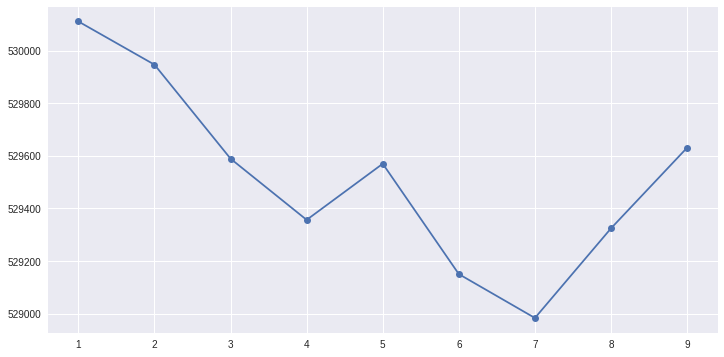

In [0]:
plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors,marker = "o")
optimal_cluster = np.argmin(clusters_df.cluster_errors)+2
print('Optimal number of cluster = ',optimal_cluster)

In [0]:
M, C = kMedoid(D_tfidf,8)

In [0]:
cluster0 = []
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []


for label in C:
    for point_idx in C[label]:
        if label == 0 :
            cluster0.append(feature_names[point_idx])
        elif label == 1:
            cluster1.append(feature_names[point_idx])
        elif label == 2:
            cluster2.append(feature_names[point_idx])
        elif label == 3:
            cluster3.append(feature_names[point_idx])
        elif label == 4:
            cluster4.append(feature_names[point_idx])
        elif label == 5:
            cluster5.append(feature_names[point_idx])
        elif label == 6:
            cluster6.append(feature_names[point_idx])
        elif label == 7:
            cluster7.append(feature_names[point_idx])
            

In [0]:
word_cloud=[cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7]

Cluters 0


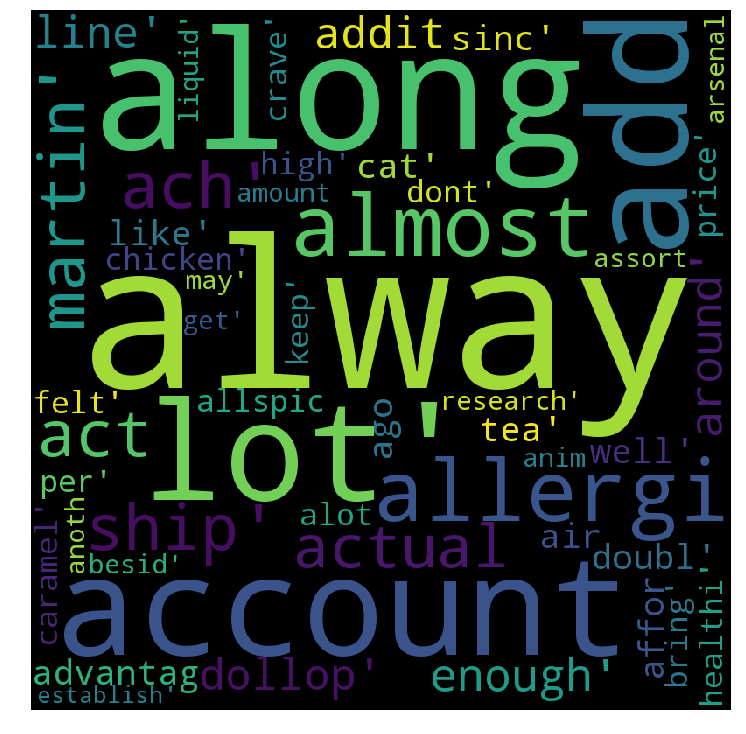

Cluters 1


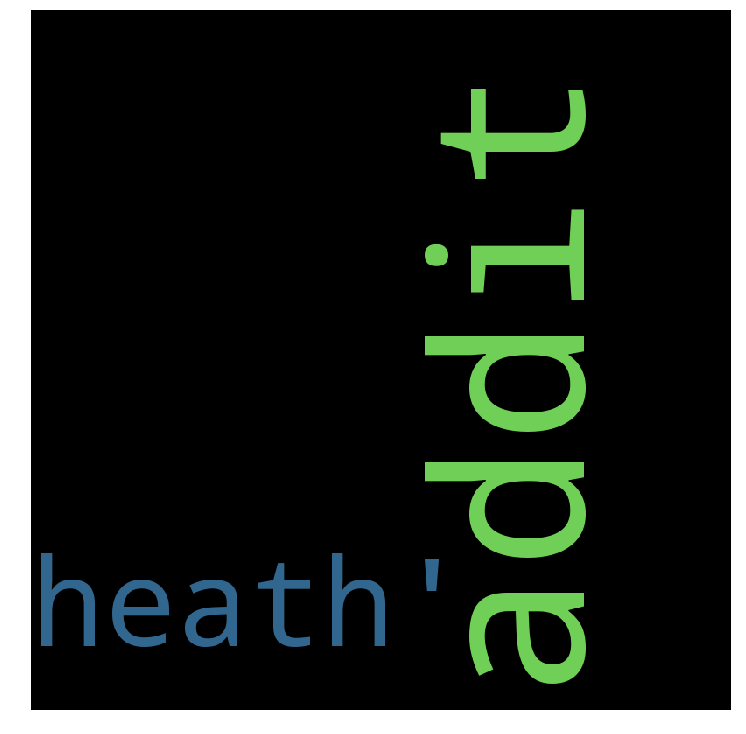

Cluters 2


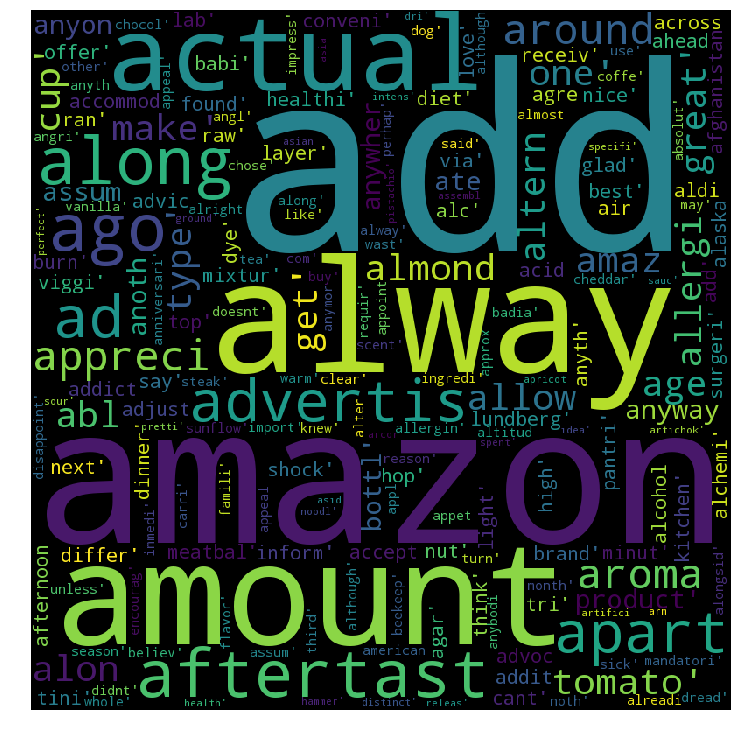

Cluters 3


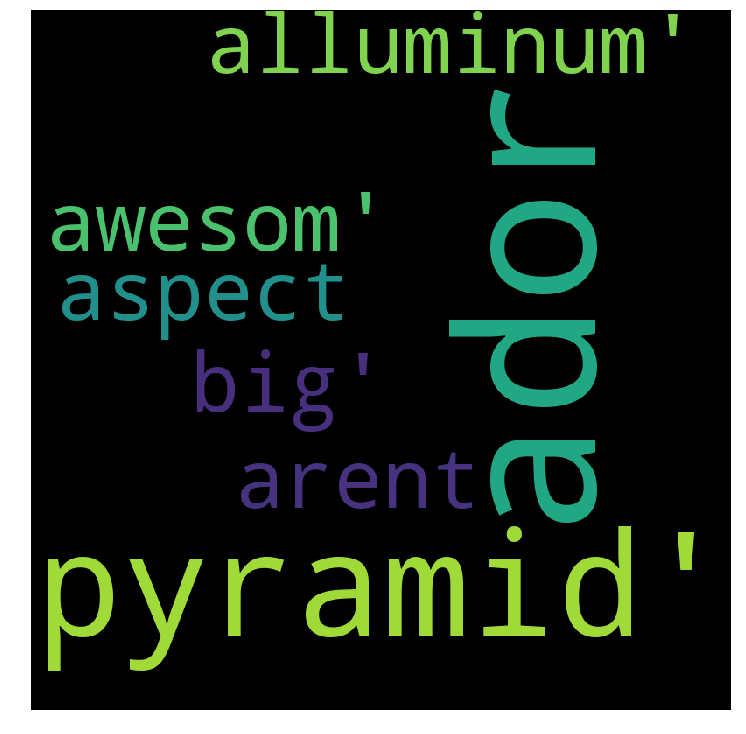

Cluters 4


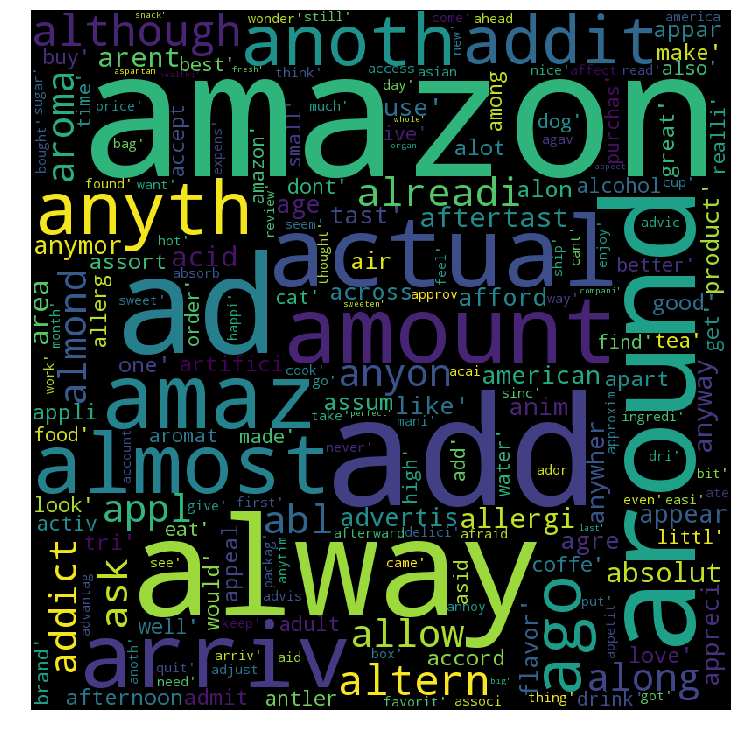

Cluters 5


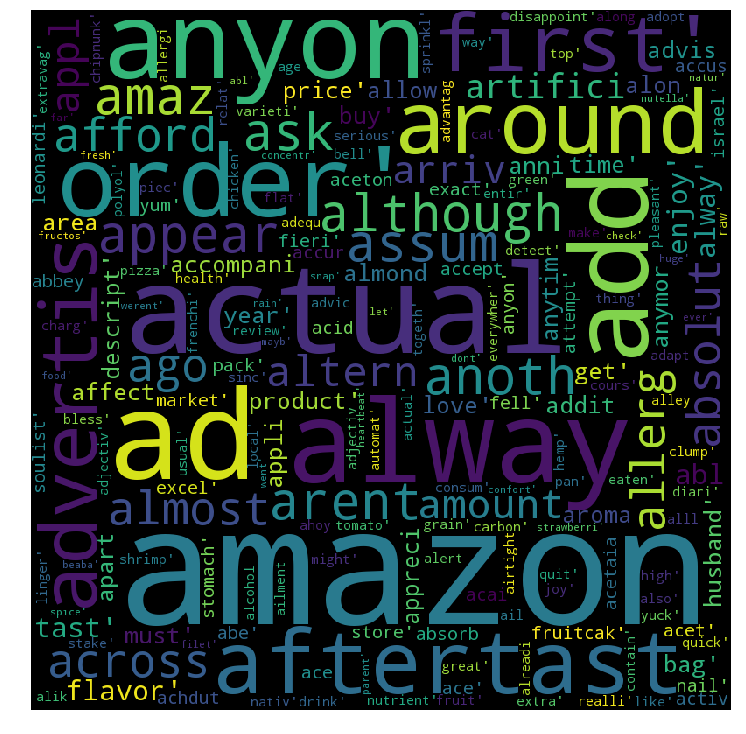

Cluters 6


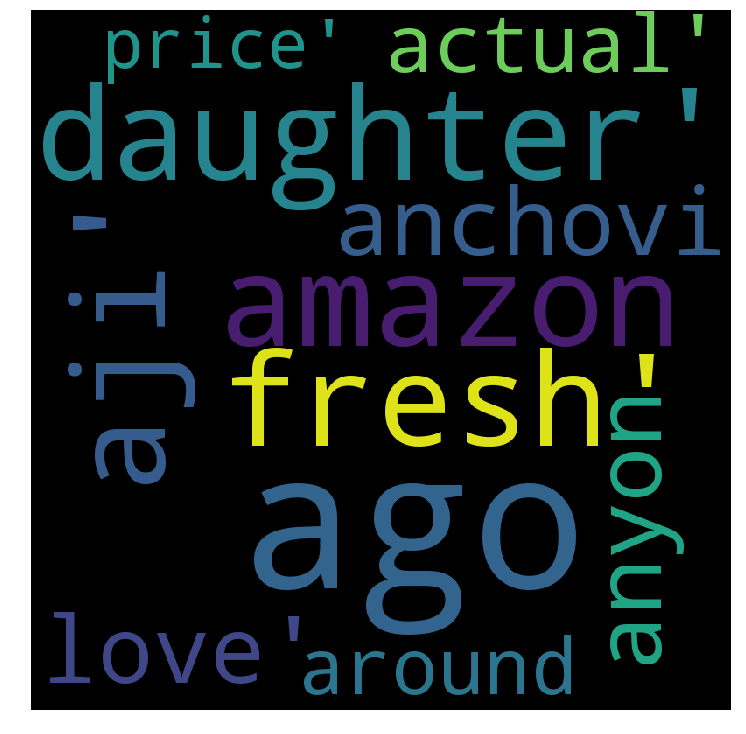

Cluters 7


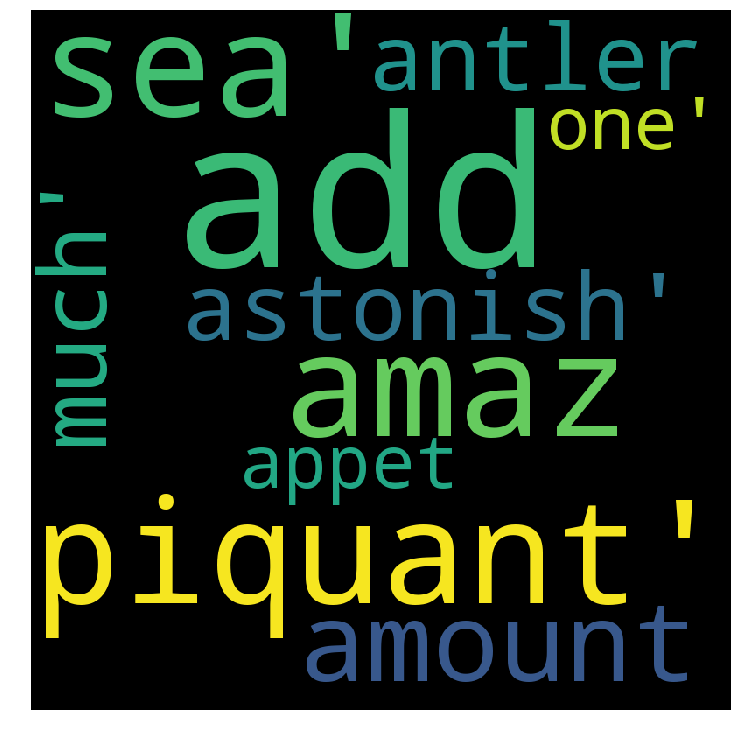

In [0]:
i=0
for Cluster in word_cloud:
  print("Cluters",i)
  wordcloud = WordCloud(width = 800, height = 800, 
            background_color ='black',
            min_font_size = 10).generate(str(Cluster))
  plt.figure(figsize = (10,10), facecolor = None) 
  plt.imshow(wordcloud) 
  plt.axis("off") 
  plt.tight_layout(pad = 0) 
  plt.show()
  i=i+1

# 6 Word2Vec

In [0]:
i=0
list_of_sent=[]
for sent in x:
    list_of_sent.append(sent.split())

In [0]:
w2v_model=Word2Vec(list_of_sent,min_count=5,size=50, workers=4)

In [0]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  4205
sample words  ['big', 'lover', 'fig', 'jam', 'uniqu', 'flavor', 'kind', 'mix', 'light', 'dark', 'mission', 'must', 'tri', 'great', 'product', 'good', 'price', 'definit', 'order', 'use', 'bottl', 'empti', 'expect', 'box', 'full', 'fortun', 'cooki', 'like', 'one', 'nonetheless', 'got', 'small', 'tast', 'weird', 'okay', 'best', 'ever', 'review', 'amazon', 'check', 'label', 'contain', 'sure', 'enough', 'top', 'ingredi', 'ive', 'done', 'research', 'also']


# 7.Avg W2V

In [0]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in list_of_sent: # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

10000
50


In [0]:
x_av1=sent_vectors

In [0]:
D_av1= pairwise_distances(x_av1, metric='euclidean')

In [0]:
#finding the feature name
feature_names=w2v_model.wv.index2word

In [0]:
# Choosing the best cluster using Elbow Method.
squared_errors = []
num_clus=[1,2,3,4,5,6,7,8,9]
for cluster in num_clus:
    M, C = kMedoid(D_av1, cluster) # Training Clustering.
    squared_errors.append(compute_loss(M, C, x_av1)) # Appending the squared loss obtained in the list

In [0]:
clusters_df = pd.DataFrame( { "num_clusters":num_clus, "cluster_errors": squared_errors } )

Optimal number of cluster =  8


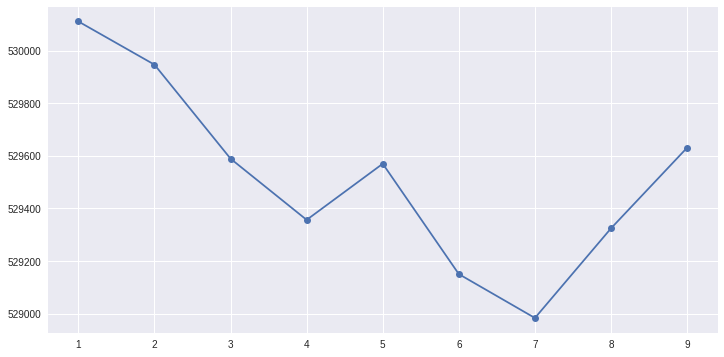

In [0]:
plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors,marker = "o")
optimal_cluster = np.argmin(clusters_df.cluster_errors)+2
print('Optimal number of cluster = ',optimal_cluster)

In [0]:
M, C = kMedoid(D_av1,8)

In [0]:
cluster0 = []
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []


for label in C:
    for point_idx in C[label]:
        if label == 0 :
            cluster0.append(feature_names[point_idx])
        elif label == 1:
            cluster1.append(feature_names[point_idx])
        elif label == 2:
            cluster2.append(feature_names[point_idx])
        elif label == 3:
            cluster3.append(feature_names[point_idx])
        elif label == 4:
            cluster4.append(feature_names[point_idx])
        elif label == 5:
            cluster5.append(feature_names[point_idx])
        elif label == 6:
            cluster6.append(feature_names[point_idx])
        elif label == 7:
            cluster7.append(feature_names[point_idx])
            

In [0]:
word_cloud=[cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7]

Cluters 0


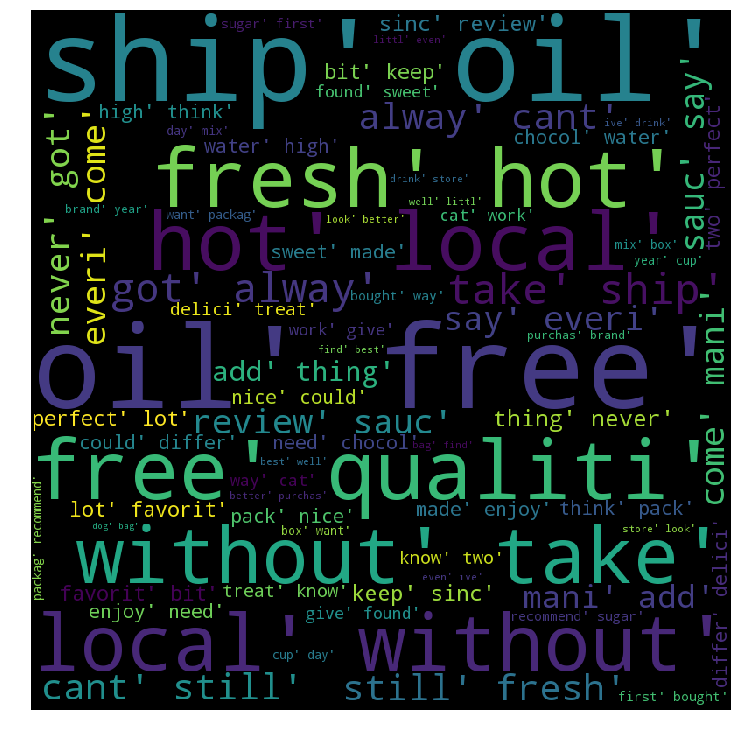

Cluters 1


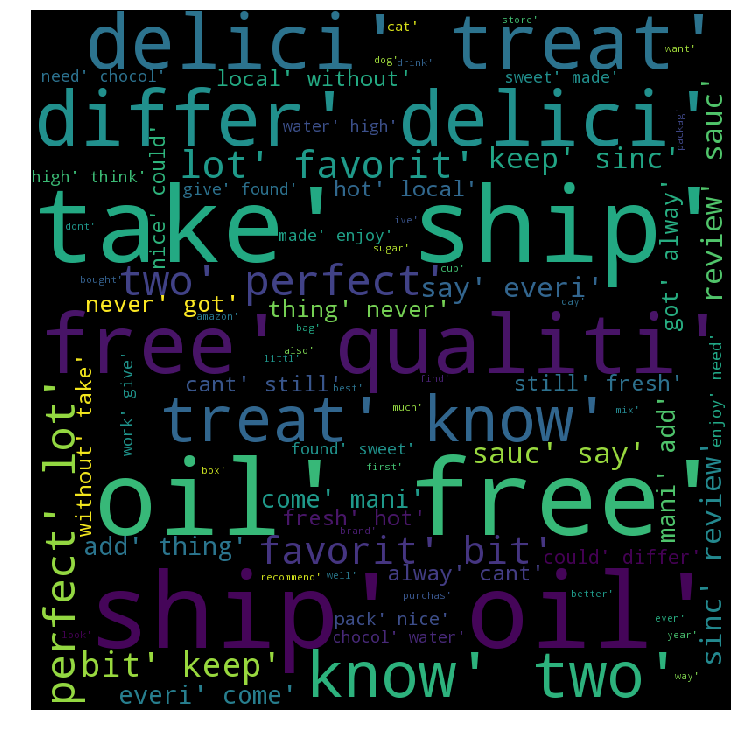

Cluters 2


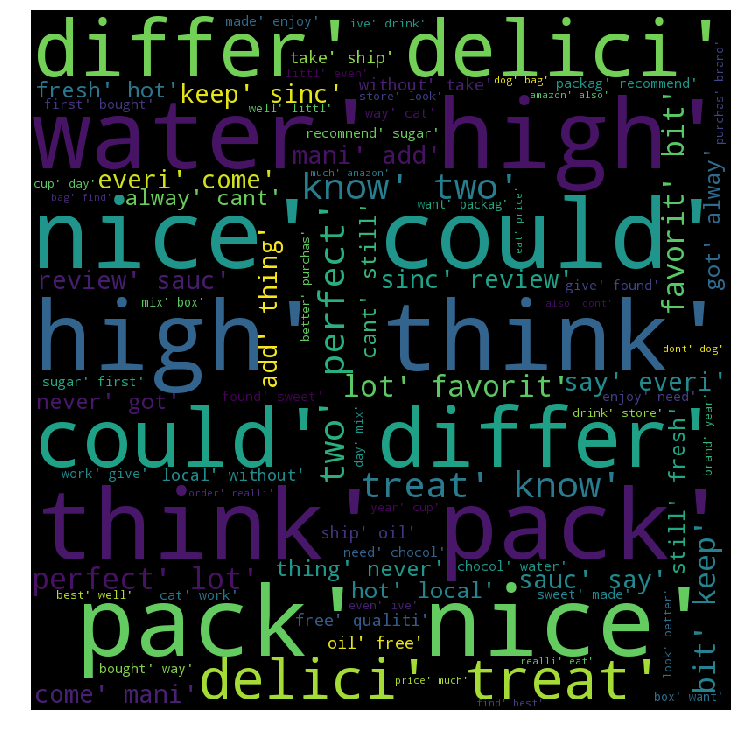

Cluters 3


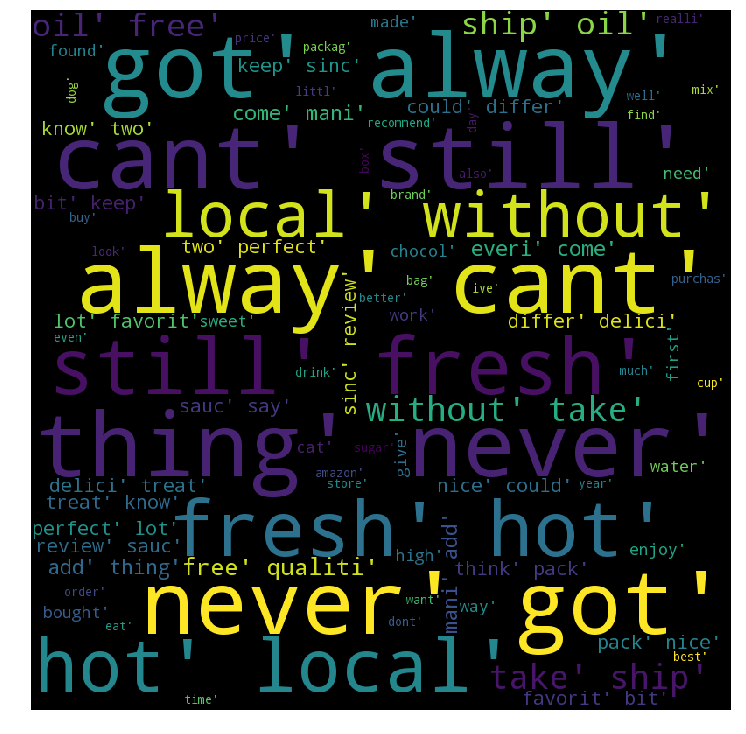

Cluters 4


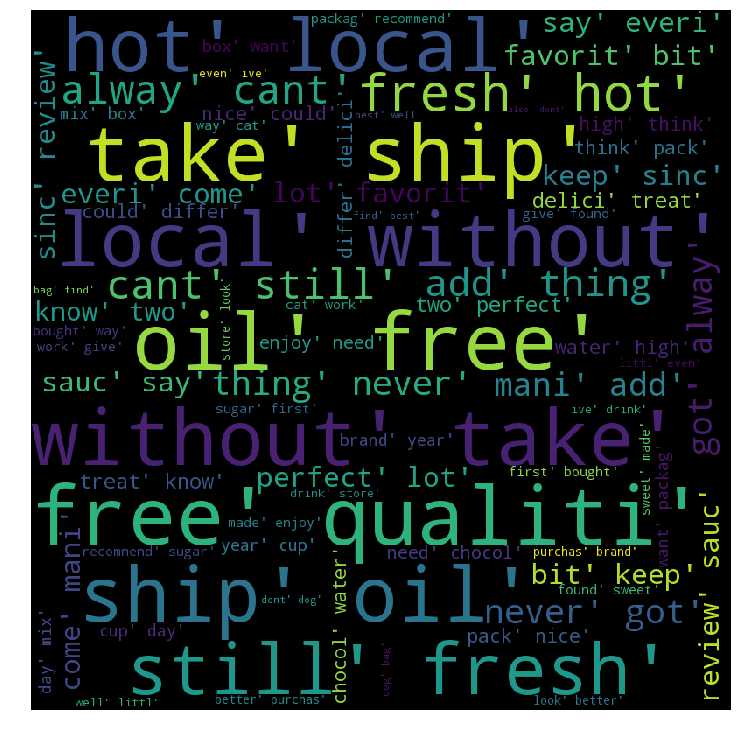

Cluters 5


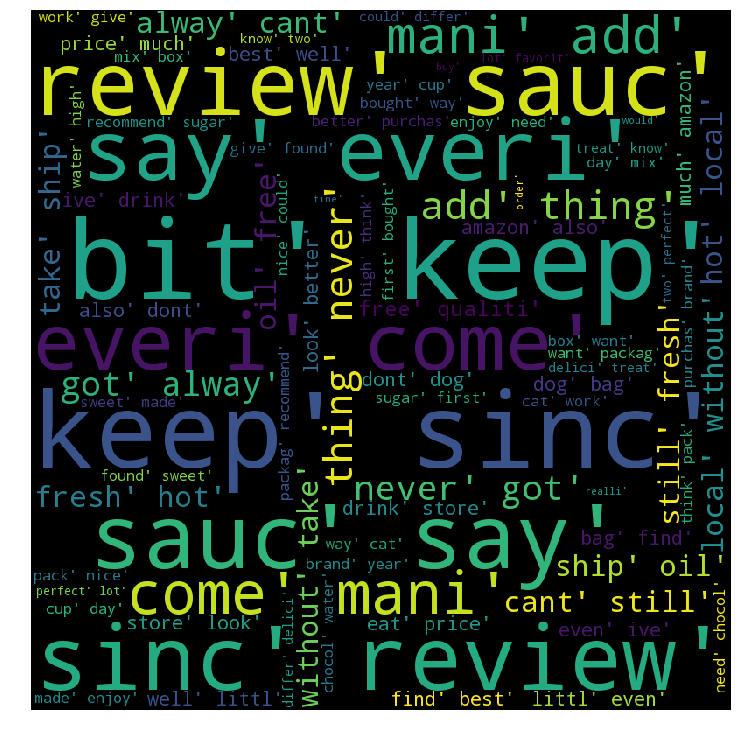

Cluters 6


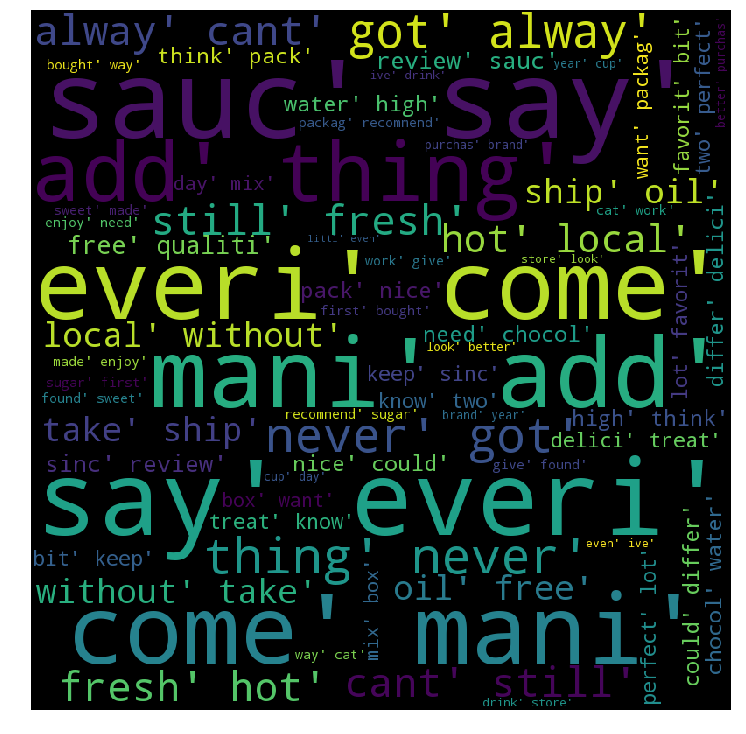

Cluters 7


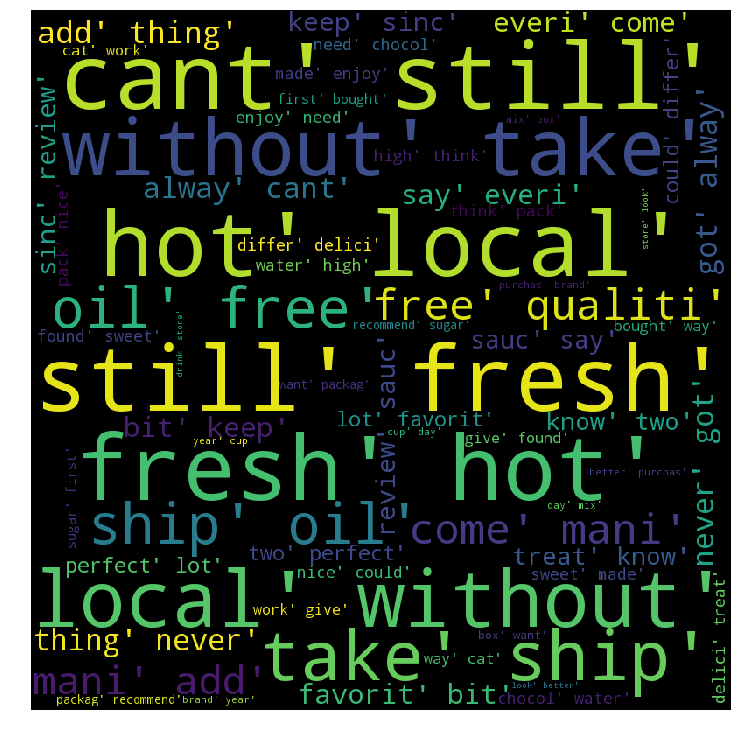

In [0]:
i=0
for Cluster in word_cloud:
  print("Cluters",i)
  wordcloud = WordCloud(width = 800, height = 800, 
            background_color ='black',
            min_font_size = 10).generate(str(Cluster))
  plt.figure(figsize = (10,10), facecolor = None) 
  plt.imshow(wordcloud) 
  plt.axis("off") 
  plt.tight_layout(pad = 0) 
  plt.show()
  i=i+1

# 8. TFIDF-W2V

In [0]:
tf_idf_vect = TfidfVectorizer()
final_tf_idf = tf_idf_vect.fit_transform(x)
dictionary = dict(zip(tf_idf_vect.get_feature_names(), list(tf_idf_vect.idf_)))

In [21]:
# TF-IDF weighted Word2Vec
tfidf_feat = tf_idf_vect.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sent): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            tf_idf = dictionary[word]*sent.count(word)
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1

100%|██████████| 10000/10000 [00:10<00:00, 978.35it/s]


In [0]:
x_tdfw2v=tfidf_sent_vectors

In [0]:
from sklearn.metrics import pairwise_distances
D_tdfw2v= pairwise_distances(x_tdfw2v, metric='euclidean')

In [0]:
#finding the feature name
feature_names=w2v_model.wv.index2word

In [0]:
# Choosing the best cluster using Elbow Method.
squared_errors = []
num_clus=[1,2,3,4,5,6,7,8,9]
for cluster in num_clus:
    M, C = kMedoid(D_tdfw2v, cluster) # Training Clustering.
    squared_errors.append(compute_loss(M, C, x_tdfw2v)) # Appending the squared loss obtained in the list

In [0]:
clusters_df = pd.DataFrame( { "num_clusters":num_clus, "cluster_errors": squared_errors } )

Optimal number of cluster =  9


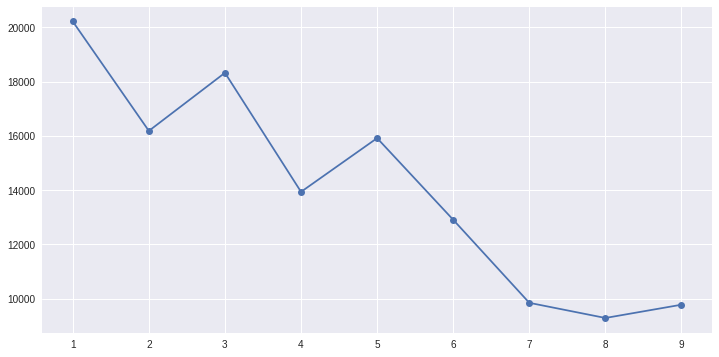

In [31]:
plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors,marker = "o")
optimal_cluster = np.argmin(clusters_df.cluster_errors)+2
print('Optimal number of cluster = ',optimal_cluster)

In [0]:
M, C = kMedoid(D_av1,9)

In [0]:
cluster0 = []
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []
cluster8 = []


for label in C:
    for point_idx in C[label]:
        if label == 0 :
            cluster0.append(feature_names[point_idx])
        elif label == 1:
            cluster1.append(feature_names[point_idx])
        elif label == 2:
            cluster2.append(feature_names[point_idx])
        elif label == 3:
            cluster3.append(feature_names[point_idx])
        elif label == 4:
            cluster4.append(feature_names[point_idx])
        elif label == 5:
            cluster5.append(feature_names[point_idx])
        elif label == 6:
            cluster6.append(feature_names[point_idx])
        elif label == 7:
            cluster7.append(feature_names[point_idx])
        elif label == 8:
            cluster8.append(feature_names[point_idx])
            

In [0]:
word_cloud=[cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,cluster6,cluster7,cluster8]

Cluters 0


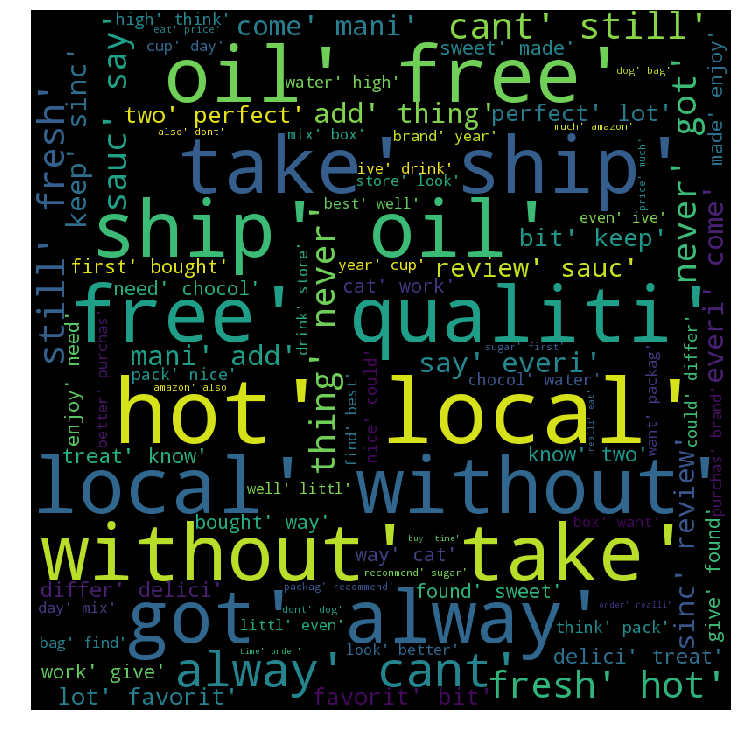

Cluters 1


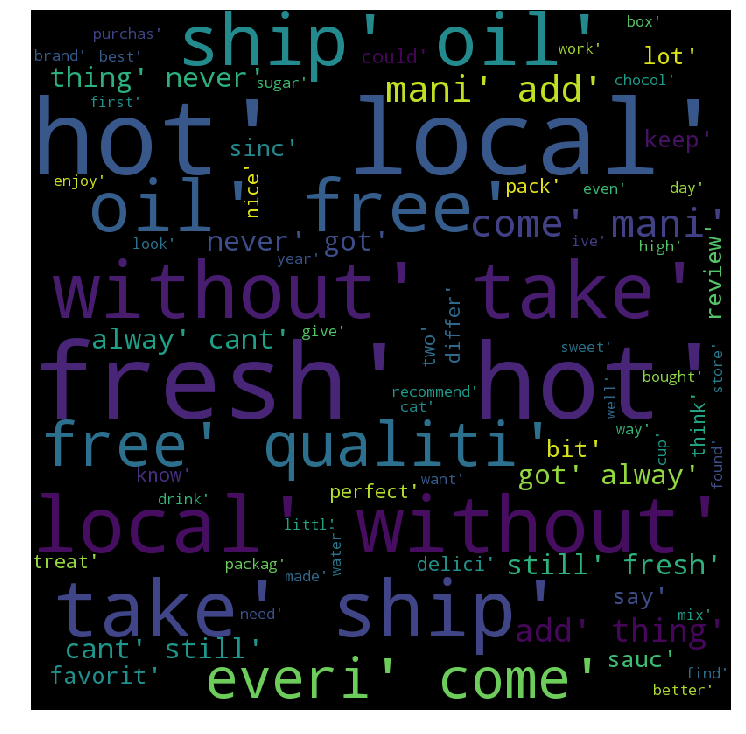

Cluters 2


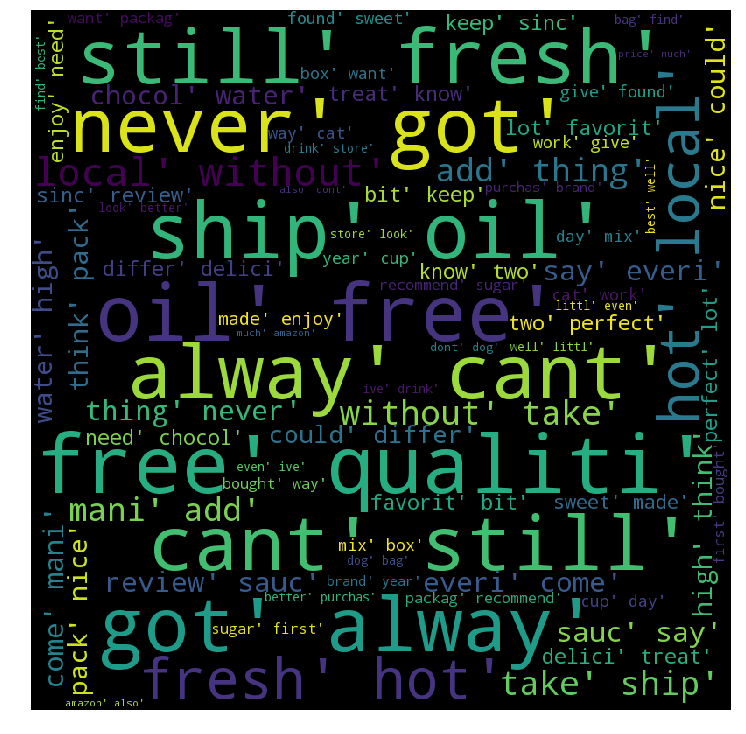

Cluters 3


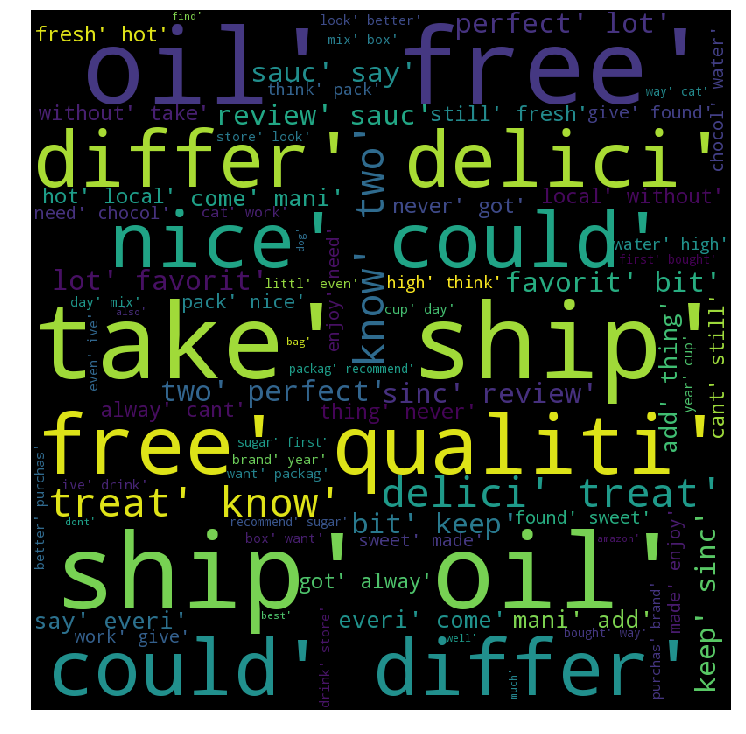

Cluters 4


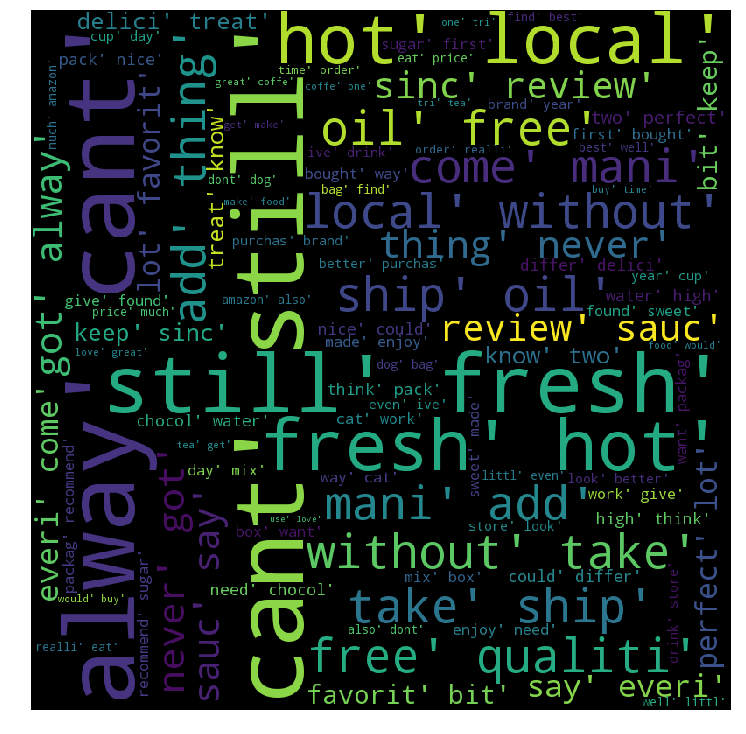

Cluters 5


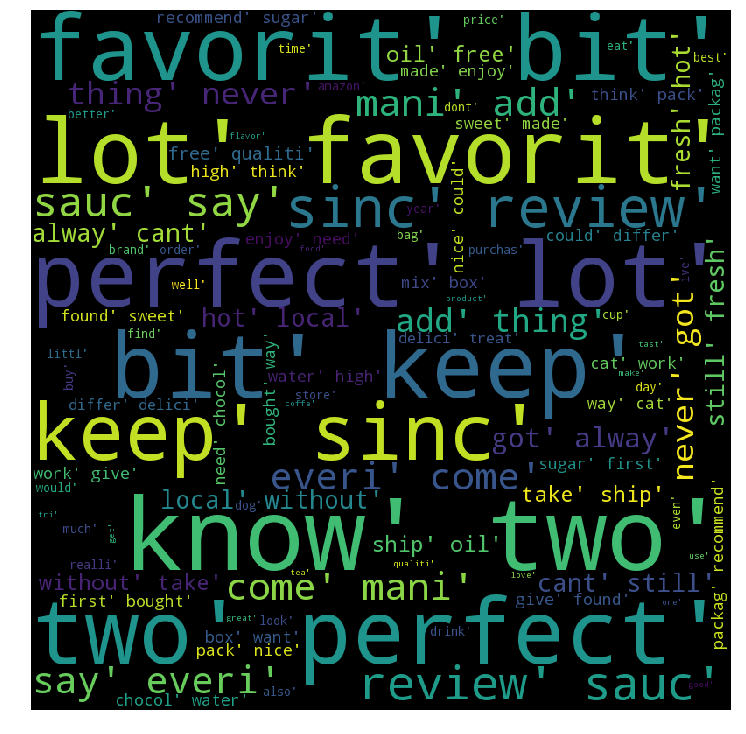

Cluters 6


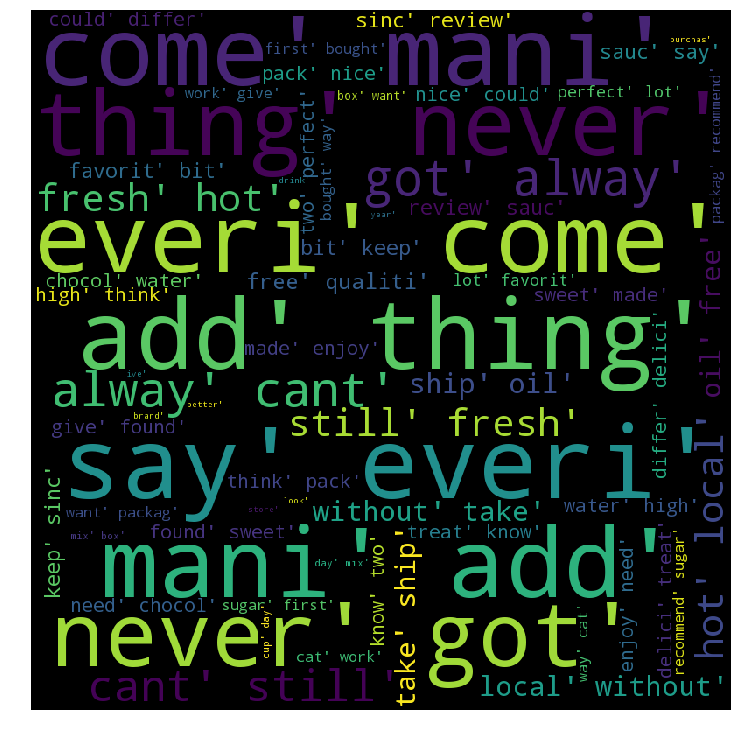

Cluters 7


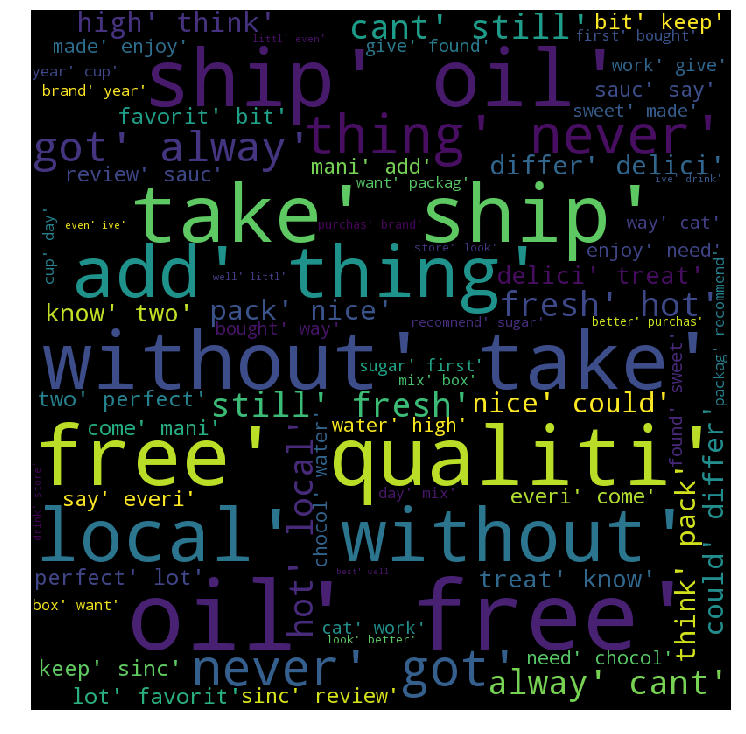

Cluters 8


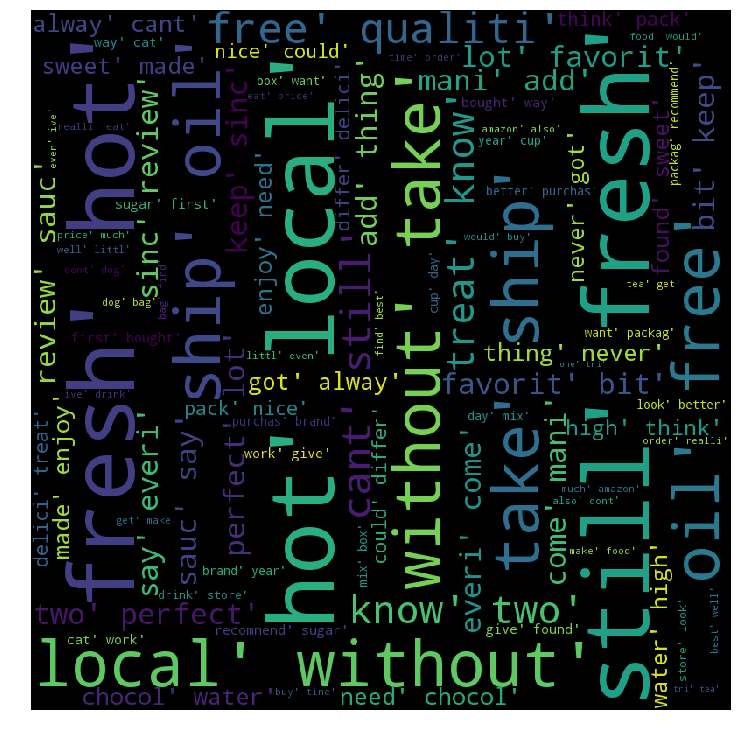

In [38]:
i=0
for Cluster in word_cloud:
  print("Cluters",i)
  wordcloud = WordCloud(width = 800, height = 800, 
            background_color ='black',
            min_font_size = 10).generate(str(Cluster))
  plt.figure(figsize = (10,10), facecolor = None) 
  plt.imshow(wordcloud) 
  plt.axis("off") 
  plt.tight_layout(pad = 0) 
  plt.show()
  i=i+1

## Conclusion
###  Kmean++ 

In [2]:
Df = {
    'Model': ['unigram', 'Bi-gram', 'Tf-IDF', 'Av-Word2Vec','Tf-IDF Word2vec'],
    'n_cluster': ['5', '8', '6', '6','4'],
    }
pd.DataFrame(Df)

,Model,n_cluster
0,unigram,5
1,Bi-gram,8
2,Tf-IDF,6
3,Av-Word2Vec,6
4,Tf-IDF Word2vec,4
